C:\Users\admin\AppData\Local\Temp\ipykernel_30180\651620033.py:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_poor = df_poor.groupby(["hour", "freq_bin"]).count().reset_index()
C:\Users\admin\AppData\Local\Temp\ipykernel_30180\651620033.py:27: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_good = df_good.groupby(["hour", "freq_bin"]).count().reset_index()


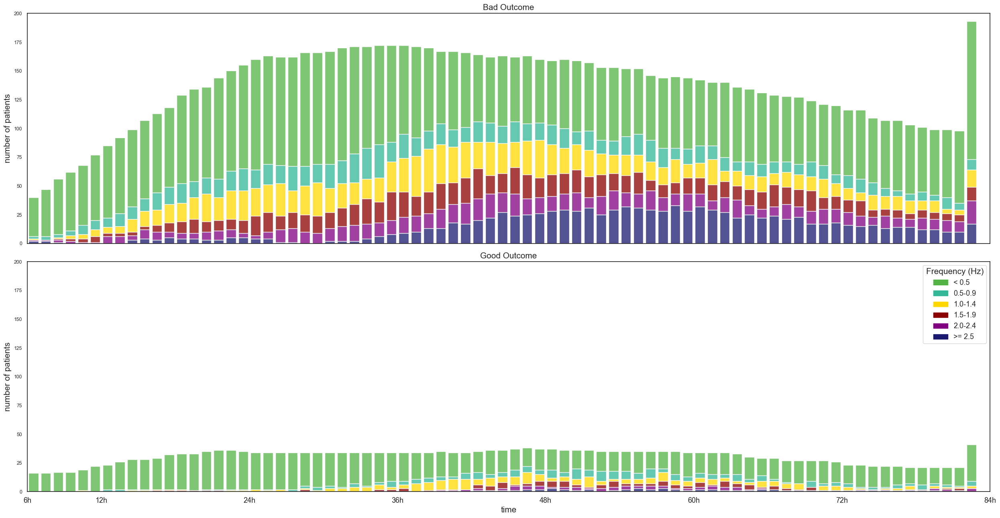

In [59]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches
sns.set_style("white")
# === 1. 读取数据并预处理 ===
df = pd.read_csv("all_feature_data_6-84.csv")
df = df.dropna(subset=["pat_ID", "hour", "ssd", "cpc"])  # 保留关键字段
df["outcome"] = df["cpc"].apply(lambda x: "good" if x in [1, 2] else "poor")
df["ssd_hz"] = df["ssd"] / 10.0  # SSD 转换为 Hz

# === 2. 频率分箱 ===
bins = [-np.inf, 0.5, 0.9, 1.4, 1.9, 2.4, np.inf]
labels = ['< 0.5', '0.5-0.9', '1.0-1.4', '1.5-1.9', '2.0-2.4', '>= 2.5']
df["freq_bin"] = pd.cut(df["ssd_hz"], bins=bins, labels=labels, right=True)

# === 3. 限制时间范围 & 去重 ===
df = df[df["hour"].between(6, 84)]
df_unique = df.drop_duplicates(subset=["pat_ID", "hour"])

# === 4. 拆分 good / poor 并 groupby 统计 ===
df_poor = df_unique[df_unique["outcome"] == "poor"]
df_good = df_unique[df_unique["outcome"] == "good"]

grouped_poor = df_poor.groupby(["hour", "freq_bin"]).count().reset_index()
grouped_good = df_good.groupby(["hour", "freq_bin"]).count().reset_index()

# === 5. 配色与标签 ===
colors = {
    '< 0.5': '#54B345' ,
    '0.5-0.9': '#32B897',
    '1.0-1.4': '#FFD700',
    '1.5-1.9': '#8B0000',
    '2.0-2.4': '#800080',
    '>= 2.5': '#191970'
}
#colors = {'< 0.5':   '#264653', '0.5-0.9': '#287271', '1.0-1.4': '#299D90', '1.5-1.9': '#8AB17D',  '2.0-2.4': '#E8C56B', '>= 2.5':  '#E66F51'}
hue_order = labels

# === 6. 绘图 ===
fig, axes = plt.subplots(2, 1, figsize=(25, 13), sharex=True)

# Poor Outcome
sns.histplot(
    grouped_poor,
    x='hour',
    weights='pat_ID',
    hue='freq_bin',
    multiple='stack',
    palette=colors,
    edgecolor='white',
    shrink=0.8,
    binwidth=1,
    hue_order=hue_order,
    legend=False,
    ax=axes[0]
)
axes[0].set_title("Bad Outcome", fontsize=15)
axes[0].set_xticks([6, 12, 24, 36, 48, 60, 72, 84])
axes[0].set_xticklabels(['6h', '12h', '24h', '36h', '48h', '60h', '72h', '84h'], fontsize=12)
axes[0].set_xlim(6, 84)
axes[0].set_ylabel('number of patients', fontsize=15)
axes[0].set_ylim(0, 200)
axes[0].set_xlabel(None)

# Good Outcome
sns.histplot(
    grouped_good,
    x='hour',
    weights='pat_ID',
    hue='freq_bin',
    multiple='stack',
    palette=colors,
    edgecolor='white',
    shrink=0.8,
    binwidth=1,
    hue_order=hue_order,
    ax=axes[1]
)
axes[1].set_title("Good Outcome", fontsize=15)
axes[1].set_xticks([6, 12, 24, 36, 48, 60, 72, 84])
axes[1].set_xticklabels(['6h', '12h', '24h', '36h', '48h', '60h', '72h', '84h'], fontsize=13)
axes[1].set_ylabel('number of patients', fontsize=15)
axes[1].set_xlabel('time', fontsize=15)
axes[1].set_xlim(6, 84)
axes[1].set_ylim(0, 200)

# Legend
custom_patches = [mpatches.Patch(color=colors[l], label=l) for l in hue_order]
axes[1].legend(
    handles=custom_patches,
    title='Frequency (Hz)',
    title_fontsize=15,
    fontsize=13,
)

plt.tight_layout()
plt.show()

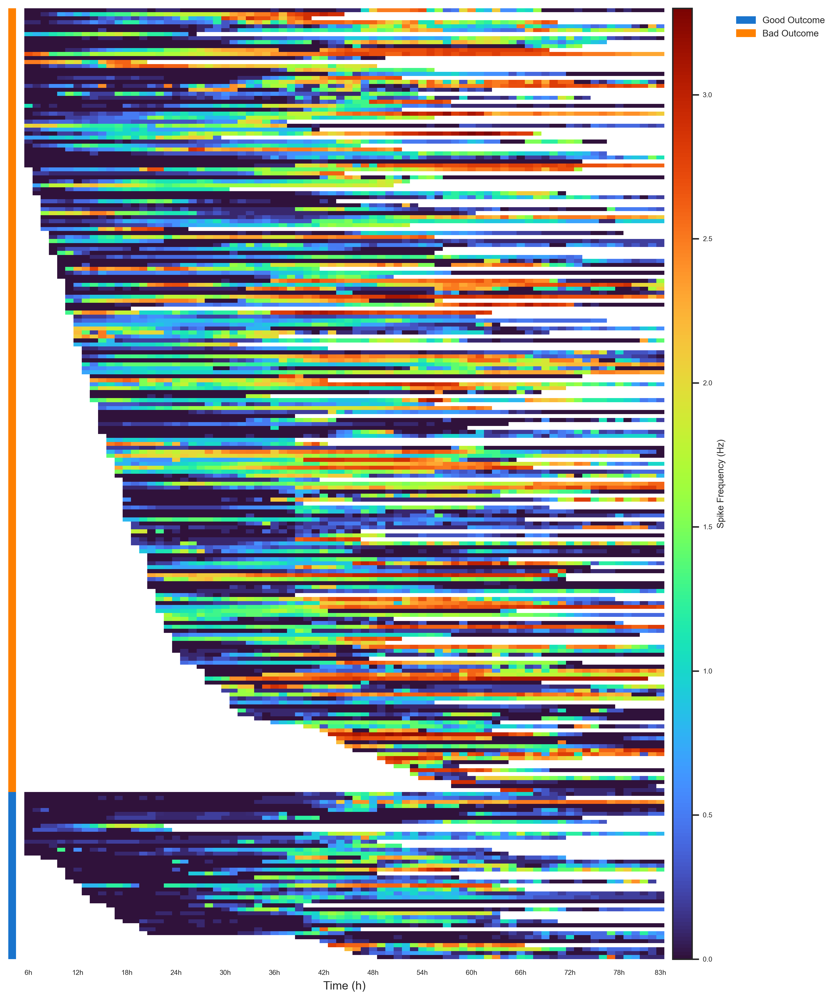

In [60]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colormaps
from matplotlib.colors import ListedColormap, BoundaryNorm
from mpl_toolkits.axes_grid1 import make_axes_locatable

# 1. Load data
df = pd.read_csv("all_feature_data_6-84.csv")
df = df.dropna(subset=["ssd", "cpc"])
df["outcome"] = df["cpc"].apply(lambda x: "good" if x in [1, 2] else "poor")

# 2. Sort patients by outcome & start_time
start_times = df.groupby("pat_ID")["hour"].min().rename("start_time")
patients = (
    df[["pat_ID", "outcome"]]
    .drop_duplicates()
    .merge(start_times, on="pat_ID")
)
patients["rank"] = patients["outcome"].map({"poor": 0, "good": 1})
patients_sorted = patients.sort_values(["rank", "start_time", "pat_ID"])
pat_order = patients_sorted["pat_ID"].tolist()
true_cpc = patients_sorted["outcome"].map({"good": 0, "poor": 1}).tolist()

# 3. Pivot into matrix
time_axis = sorted(df["hour"].unique())
df_pivot = df.pivot(index="pat_ID", columns="hour", values="ssd")
df_pivot = df_pivot.reindex(index=pat_order, columns=time_axis)
mat = df_pivot.values

# 4. Build meshgrid for pcolormesh
n_pat, n_time = mat.shape
x = np.arange(n_time + 1)
y = np.arange(n_pat + 1)
X, Y = np.meshgrid(x, y)

# 5. Plot with pcolormesh
fig, ax = plt.subplots(figsize=(10, 12), dpi=300)
cmap = colormaps["turbo"].copy()
cmap.set_bad(color="white")

# pcolormesh expects (n+1, m+1) grid and (n, m) values
pc = ax.pcolormesh(X, Y, mat, cmap=cmap, shading="flat")

# 6. X-axis
min_h, max_h = time_axis[0], time_axis[-1]
xticks = []
xtick_labels = []

for i, h in enumerate(time_axis):
    if h % 6 == 0 or h in [min_h, max_h]:
        xticks.append(i + 0.5)
        xtick_labels.append(f"{h}h")

ax.set_xticks(xticks)
ax.set_xticklabels(xtick_labels, fontsize=6, rotation=0)
ax.set_xlabel("Time (h)", fontsize=10)



# 7. Y-axis
ax.set_yticks([])
ax.set_xlim(0, n_time)
ax.set_ylim(n_pat, 0)  # invert y

for spine in ax.spines.values():
    spine.set_visible(False)

# 8. Left CPC strip
divider = make_axes_locatable(ax)
cax2 = divider.append_axes("left", size="1.2%", pad=0.1)
label_matrix = np.array(true_cpc).reshape(-1, 1)
cmap_cpc = ListedColormap(['#1974cd', '#fe8000'])
bounds = [-0.5, 0.5, 1.5]
norm = BoundaryNorm(bounds, cmap_cpc.N)
cax2.imshow(label_matrix, cmap=cmap_cpc, norm=norm, aspect="auto", interpolation="none", origin="upper")
cax2.axis("off")

# 9. Colorbar
# 9. Colorbar
cax = divider.append_axes("right", size="3%", pad=0.1)
cbar = fig.colorbar(pc, cax=cax)

# 修改 colorbar 标签
cbar.set_label("Spike Frequency (Hz)", fontsize=8)

# 修改刻度显示为原数值 ÷ 10
def format_tick(x, pos):
    return f"{x / 10:.1f}"

cbar.ax.yaxis.set_major_formatter(plt.FuncFormatter(format_tick))
cbar.ax.tick_params(labelsize=6)


# 10. CPC legend
from matplotlib.patches import Patch
legend_patches = [
    Patch(color='#1974cd', label="Good Outcome"),
    Patch(color= '#fe8000', label="Bad Outcome"),
]
ax.legend(handles=legend_patches, bbox_to_anchor=(1.1, 1), loc="upper left", frameon=False, fontsize=8)

plt.tight_layout(pad=0.5)
plt.show()


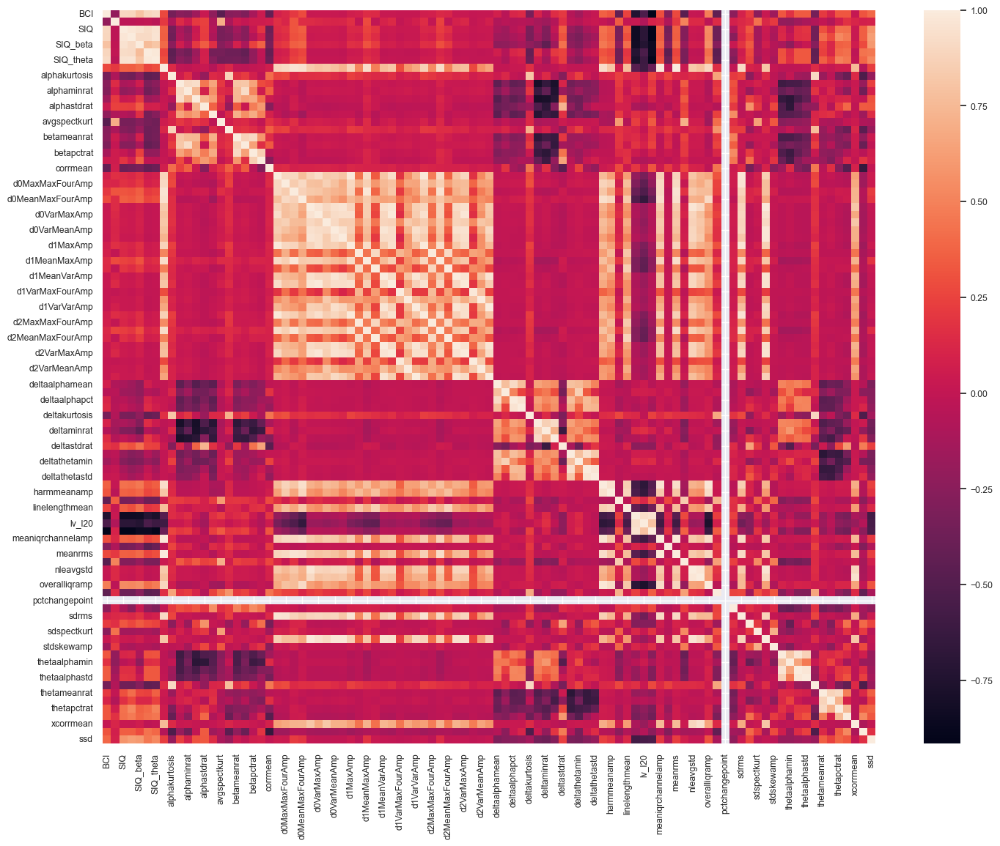

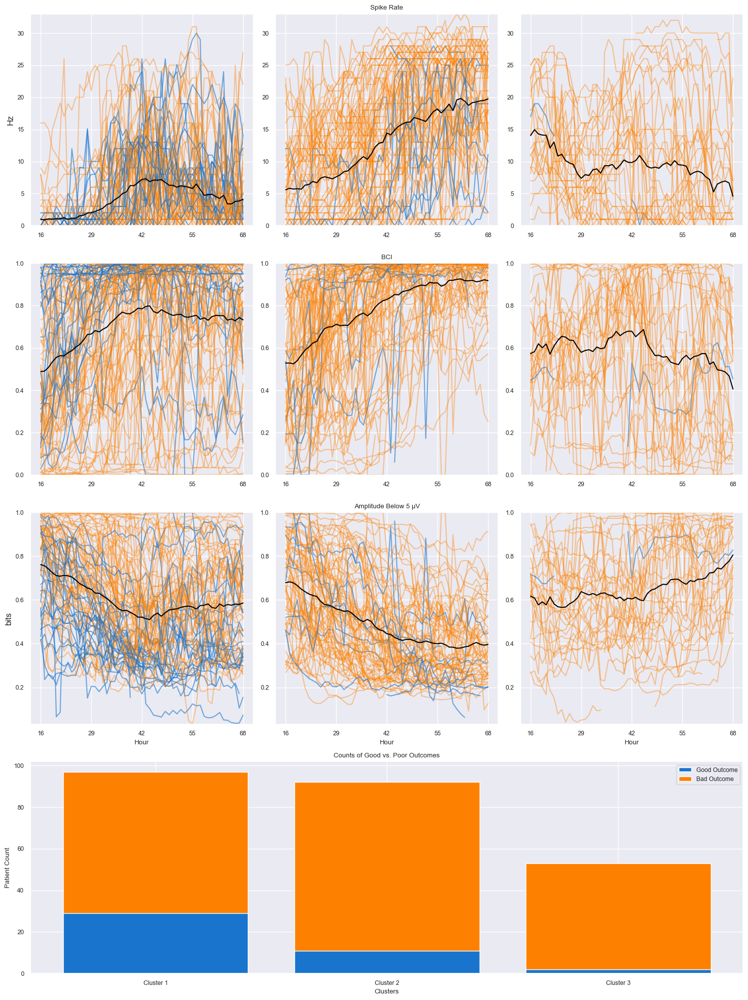

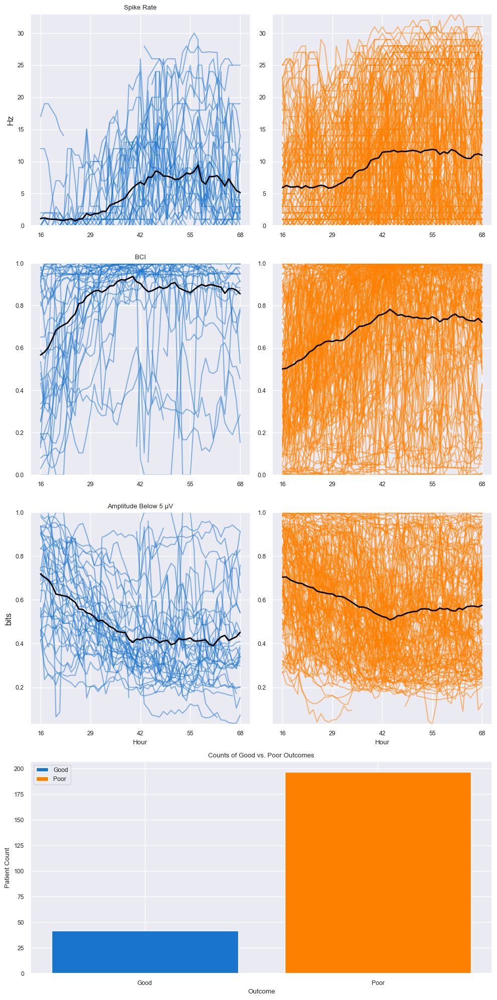

In [61]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import mat73
import matplotlib.pyplot as plt
from scipy.io import loadmat
from tslearn.clustering import TimeSeriesKMeans
from datetime import datetime
from tslearn.preprocessing import TimeSeriesScalerMinMax

# Load the dataset
all_feature_data = pd.read_csv("all_feature_data—16start.csv", index_col = 0)

X = all_feature_data.drop(columns=['cpc', 'pat_ID', 'hour'])
y = all_feature_data['cpc'].apply(lambda val: 'good' if val in [1, 2] else 'poor').to_numpy()

# Plot the correlation matrix
plt.figure(figsize=(17, 13))
sns.set_style('whitegrid')
sns.set_theme(font_scale=0.8)

df_corr = X.corr()

ax = sns.heatmap(df_corr, annot=False)

plt.savefig("corr_plot.png", dpi=300)

# Select the top 3 features based on the highest scores
metadata = all_feature_data[['pat_ID', 'cpc']].drop_duplicates().reset_index(drop=True)
feature_arrays = []
max_length = 0  # Track max sequence length dynamically

features = [col for col in all_feature_data.columns if col not in ['cpc', 'pat_ID', 'hour']]
for feature in features:
    df_pivot = all_feature_data.pivot(index='pat_ID', columns='hour', values=feature)  # (patients x time)
    pivot_array = [df_pivot.loc[row].dropna().to_list() for row in df_pivot.index]
    max_length = max(max_length, max(len(pat_row) for pat_row in pivot_array))
    pivot_array = [pat_row + [np.nan] * (max_length - len(pat_row)) for pat_row in pivot_array]
    feature_arrays.append(np.array(pivot_array))  # Shape: (patients, time)

# Stack along last axis to get (patients, time, features)
X_3D = np.stack(feature_arrays, axis=-1)

X_filtered = X_3D[:, :, features.index('ssd')]

normalized_data = TimeSeriesScalerMinMax().fit_transform(X_filtered)

n_clusters = 3
clusters = TimeSeriesKMeans(n_clusters=n_clusters, metric="dtw").fit_predict(normalized_data)

cluster_df = pd.DataFrame({'pat_ID': metadata['pat_ID'], 'cluster': clusters})
#cluster_df.to_csv("clusters_ssd_only—16start.csv", index=False)
#cluster_df.to_csv("clusters_ssd_only.csv", index=False)

# === 加载数据 ===
cluster_df = pd.read_csv("clusters_ssd_only.csv")   # 必须包含 pat_ID 和 cluster 列
all_feature_data = pd.read_csv("all_feature_data—16start.csv")  # 包含 pat_ID, hour, feature columns, cpc

# === Step 1: 取交集，获得有效病人列表 ===
valid_ids = sorted(set(cluster_df['pat_ID']) & set(all_feature_data['pat_ID']))

# === Step 2: 对齐 metadata（cpc label） ===
metadata = all_feature_data[all_feature_data['pat_ID'].isin(valid_ids)][['pat_ID', 'cpc']].drop_duplicates()
metadata = metadata.set_index('pat_ID').loc[valid_ids].reset_index()

# === Step 3: 对齐 clusters（聚类标签） ===
cluster_df = cluster_df.set_index('pat_ID').loc[valid_ids].reset_index()
clusters = cluster_df['cluster'].to_numpy()

# === Step 4: 提取所有用于建模的特征列（除去标签列和辅助列） ===
features = [c for c in all_feature_data.columns if c not in ['pat_ID', 'hour', 'cpc']]

# === Step 5: 构建 3D 特征张量 X_3D: (patients, time, features) ===
feature_arrays = []
for feat in features:
    df_pivot = all_feature_data.pivot(index='pat_ID', columns='hour', values=feat)
    df_pivot = df_pivot.loc[valid_ids]  # 强制顺序一致
    feature_arrays.append(df_pivot.to_numpy())  # shape: (patients, time)

X_3D = np.stack(feature_arrays, axis=-1)  # shape = (patients, time, features)

# Redo X_3D for plotting
for feature in features:
    df_pivot = all_feature_data.pivot(index='pat_ID', columns='hour', values=feature)  # (patients x time)
    pivot_array = [df_pivot.loc[row].to_list() for row in df_pivot.index]
    feature_arrays.append(np.array(pivot_array))  # Shape: (patients, time)

X_3D = np.stack(feature_arrays, axis=-1)

# note: removed 'SIQ' for plotting
y_labs = ['Hz', '', 'bits', '%']
plot_features = ['ssd', 'BCI', 'lv_l5']
plot_feature_indices = [features.index(f) for f in plot_features]
feature_labs = ['Spike Rate', 'BCI', 'Amplitude Below 5 µV']

fig, axes = plt.subplots(len(plot_features) + 1, n_clusters, figsize=(n_clusters * 5, (len(plot_features) + 1) * 5))

y_lims = []  
for feature_idx in plot_feature_indices:
    feature_min, feature_max = np.inf, -np.inf  
    for cluster_id in range(n_clusters):
        cluster_indices = np.where(clusters == cluster_id)[0]
        cluster_values = X_3D[cluster_indices, :, feature_idx].flatten()
        cluster_values = cluster_values[~np.isnan(cluster_values)]
        if len(cluster_values) > 0:
            feature_min = min(feature_min, cluster_values.min())
            feature_max = max(feature_max, cluster_values.max())
    y_lims.append((feature_min, feature_max))  

for row, (feature_idx, feature_name, y_lab, (y_min, y_max)) in enumerate(zip(plot_feature_indices, feature_labs, y_labs, y_lims)):
    
    good_counts = []
    bad_counts = []

    # Loop through clusters and plot signals
    for cluster_id in range(n_clusters):
        ax = axes[row, cluster_id]
        cluster_indices = np.where(clusters == cluster_id)[0]  # Indices of patients in this cluster
        cluster = []

        # Count good and bad outcomes
        good_count = np.sum(metadata['cpc'][cluster_indices].isin([1, 2]))
        bad_count = len(cluster_indices) - good_count
        good_counts.append(good_count)
        bad_counts.append(bad_count)

        # Plot each patient's time series for this feature
        for idx in cluster_indices:
            color = '#1974cd' if metadata['cpc'][idx] in [1, 2] else '#fe8000' # Blue for good outcome, orange for poor outcome
            alpha = 0.6 if metadata['cpc'][idx] in [1, 2] else 0.4
            ax.plot(X_3D[idx, :, feature_idx], c=color, alpha=alpha)
            cluster.append(X_3D[idx, :, feature_idx])

        # Plot the mean signal of the cluster
        ax.plot(np.nanmean(np.vstack(cluster), axis=0), c='black')
        # ax.plot(np.nanmedian(np.vstack(cluster), axis = 0), c = 'black') # for median
        ax.set_ylim(y_min, y_max)
        if row == len(plot_features) - 1:
            ax.set_xlabel("Hour")
        if cluster_id == 0:
            ax.set_ylabel(y_lab, fontsize=12)
        if cluster_id == 1:
            ax.set_title(feature_name)
        ax.set_xticks(np.linspace(0, len(X_3D[0]) - 1, num=5))
        ax.set_xticklabels(np.arange(16, 69, step=13))

for ax in axes[-1, :]:
    ax.remove()
bar_ax = fig.add_subplot(len(plot_features) + 1, 1, len(plot_features) + 1)
cluster_labels = [f"Cluster {i+1}" for i in range(n_clusters)]
bar_ax.bar(cluster_labels, good_counts, color='#1974cd', label='Good Outcome')
bar_ax.bar(cluster_labels, bad_counts, bottom=good_counts, color='#fe8000', label='Bad Outcome')
bar_ax.set_title("Counts of Good vs. Poor Outcomes")
bar_ax.set_xlabel("Clusters")
bar_ax.set_ylabel("Patient Count")
bar_ax.legend()

plt.tight_layout()
plt.savefig('eeg_dtw_cluster_ssd_only_mean.png', dpi=300)

# plot time series of good vs bad 
n_outcomes = 2
n_features = len(plot_features)

fig, axes = plt.subplots(len(plot_features) + 1, n_outcomes, figsize=(n_outcomes * 5, (len(plot_features) + 1) * 5))
for row, (feature_idx, feature_name, y_lab, (y_min, y_max)) in enumerate(zip(plot_feature_indices, feature_labs, y_labs, y_lims)):
    # Loop through clusters and plot signals
    for outcome_id in range(n_outcomes):
        ax = axes[row, outcome_id]
        cluster = []
        cluster_indices = np.where(metadata['cpc'].isin([1, 2]))[0] if outcome_id == 0 else np.where(metadata['cpc'].isin([3, 4, 5]))[0]
        color = '#1974cd' if outcome_id == 0 else '#fe8000'

        # Plot each patient's time series for this feature
        for idx in cluster_indices:
            ax.plot(X_3D[idx, :, feature_idx], c=color, alpha=.5)
            cluster.append(X_3D[idx, :, feature_idx])

        # Plot the mean signal of the cluster
        ax.plot(
            np.nanmean(np.vstack(cluster), axis=0),
            color='black',
            linewidth=2  
        )
        # ax.plot(np.nanmedian(np.vstack(cluster), axis = 0), c = 'black') # for median
        ax.set_ylim(y_min, y_max)
        if row == len(plot_features) - 1:
            ax.set_xlabel("Hour")
        if outcome_id == 0:
            ax.set_ylabel(y_lab, fontsize=12)
        if outcome_id == 0:
            ax.set_title(feature_name)
        ax.set_xticks(np.linspace(0, len(X_3D[0]) - 1, num=5))
        ax.set_xticklabels(np.arange(16, 69, step=13))#16-68
        #ax.set_xticklabels(np.arange(6, 69, step=13))

for ax in axes[-1, :]:
    ax.remove()
bar_ax = fig.add_subplot(len(plot_features) + 1, 1, len(plot_features) + 1)
cluster_labels = [f"Cluster {i+1}" for i in range(n_clusters)]
outcome = ['Good', 'Poor']
counts = [metadata['cpc'].isin([1, 2]).sum(), metadata['cpc'].isin([3, 4, 5]).sum()]
bar_ax.bar(outcome, counts, color=['#1974cd', '#fe8000'], label=outcome)
bar_ax.set_title("Counts of Good vs. Poor Outcomes")
bar_ax.set_xlabel("Outcome")
bar_ax.set_ylabel("Patient Count")
bar_ax.legend()

plt.tight_layout()
plt.savefig('eeg_outcome_cluster_ssd_only_mean.png', dpi=300)



C:\Users\admin\AppData\Local\Temp\ipykernel_30180\77282777.py:179: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  bar_ax.legend()


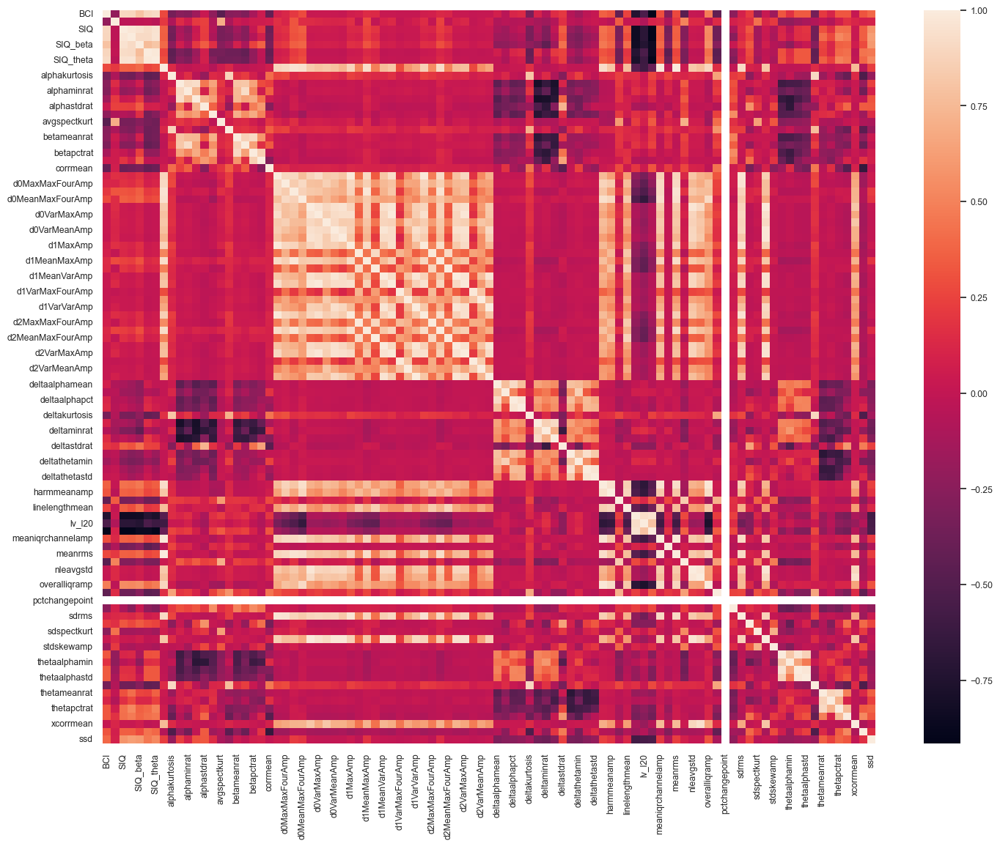

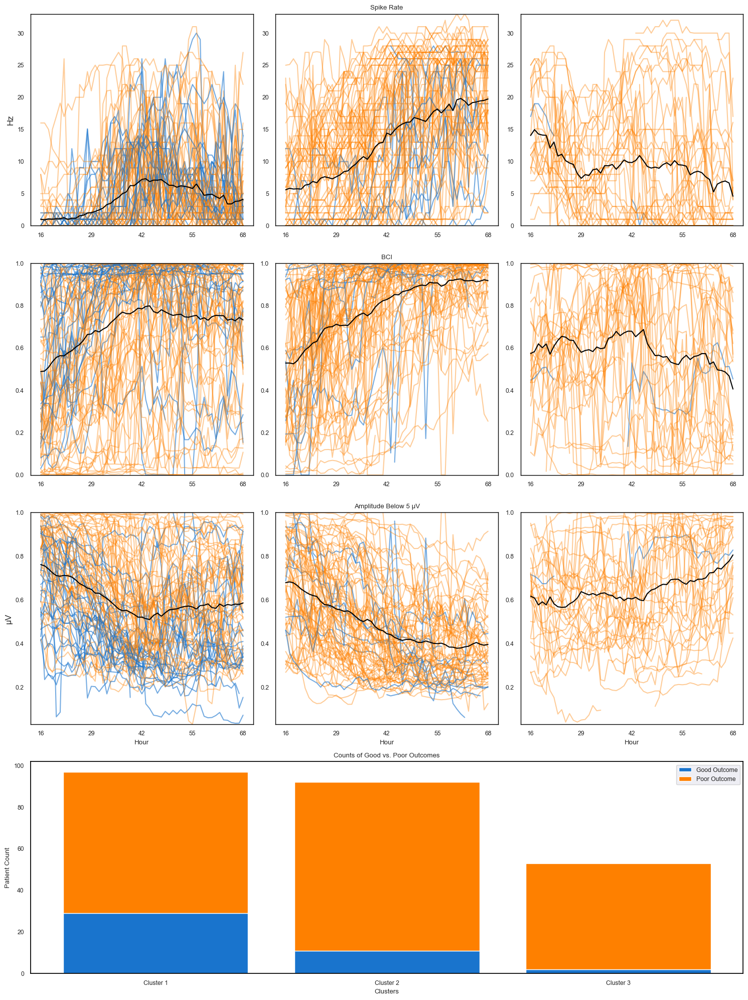

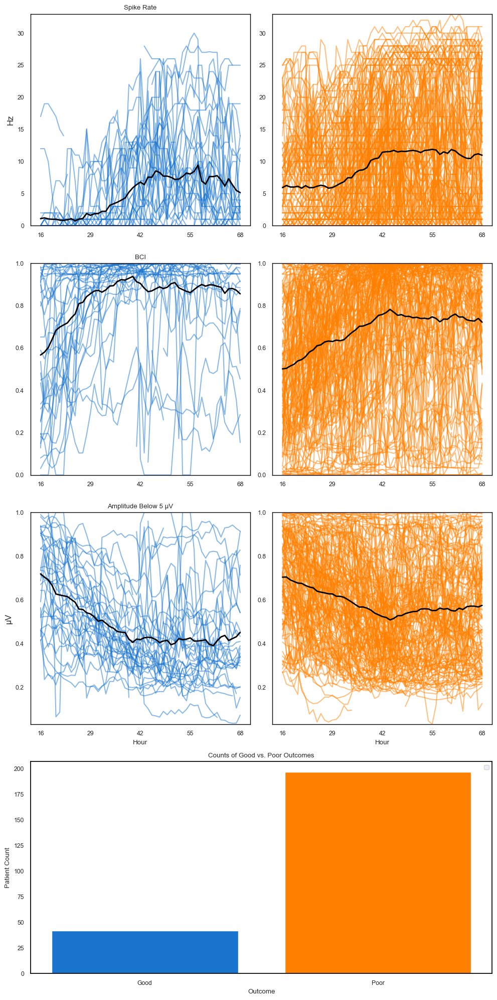

In [63]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from tslearn.clustering import TimeSeriesKMeans
from tslearn.preprocessing import TimeSeriesScalerMinMax

# === 1. Load dataset ===
all_feature_data = pd.read_csv("all_feature_data—16start.csv", index_col=0)
X = all_feature_data.drop(columns=['cpc', 'pat_ID', 'hour'])
y = all_feature_data['cpc'].apply(lambda val: 'good' if val in [1, 2] else 'poor').to_numpy()

# === 2. Correlation heatmap ===
plt.figure(figsize=(17, 13), facecolor='white')
sns.set_style('whitegrid')
sns.set_theme(font_scale=0.8)
df_corr = X.corr()
ax = sns.heatmap(df_corr, annot=False)
ax.set_facecolor('white')
plt.savefig("corr_plot.png", dpi=300, facecolor='white')

# === 3. DTW clustering with SSD ===
metadata = all_feature_data[['pat_ID', 'cpc']].drop_duplicates().reset_index(drop=True)
feature_arrays = []
max_length = 0
features = [col for col in all_feature_data.columns if col not in ['cpc', 'pat_ID', 'hour']]

for feature in features:
    df_pivot = all_feature_data.pivot(index='pat_ID', columns='hour', values=feature)
    pivot_array = [df_pivot.loc[row].dropna().to_list() for row in df_pivot.index]
    max_length = max(max_length, max(len(pat_row) for pat_row in pivot_array))
    pivot_array = [pat_row + [np.nan] * (max_length - len(pat_row)) for pat_row in pivot_array]
    feature_arrays.append(np.array(pivot_array))

X_3D = np.stack(feature_arrays, axis=-1)
X_filtered = X_3D[:, :, features.index('ssd')]
normalized_data = TimeSeriesScalerMinMax().fit_transform(X_filtered)
n_clusters = 3
clusters = TimeSeriesKMeans(n_clusters=n_clusters, metric="dtw").fit_predict(normalized_data)

cluster_df = pd.DataFrame({'pat_ID': metadata['pat_ID'], 'cluster': clusters})

# === 4. Reload for plotting ===
cluster_df = pd.read_csv("clusters_ssd_only.csv")
all_feature_data = pd.read_csv("all_feature_data—16start.csv")
valid_ids = sorted(set(cluster_df['pat_ID']) & set(all_feature_data['pat_ID']))
metadata = all_feature_data[all_feature_data['pat_ID'].isin(valid_ids)][['pat_ID', 'cpc']].drop_duplicates()
metadata = metadata.set_index('pat_ID').loc[valid_ids].reset_index()
cluster_df = cluster_df.set_index('pat_ID').loc[valid_ids].reset_index()
clusters = cluster_df['cluster'].to_numpy()

features = [c for c in all_feature_data.columns if c not in ['pat_ID', 'hour', 'cpc']]
feature_arrays = []
for feat in features:
    df_pivot = all_feature_data.pivot(index='pat_ID', columns='hour', values=feat)
    df_pivot = df_pivot.loc[valid_ids]
    feature_arrays.append(df_pivot.to_numpy())
X_3D = np.stack(feature_arrays, axis=-1)

# === 5. Cluster-wise time series plots ===
plot_features = ['ssd', 'BCI', 'lv_l5']
plot_feature_indices = [features.index(f) for f in plot_features]
feature_labs = ['Spike Rate', 'BCI', 'Amplitude Below 5 µV']
y_labs = ['Hz', '', 'µV']

fig, axes = plt.subplots(len(plot_features) + 1, n_clusters, figsize=(n_clusters * 5, (len(plot_features) + 1) * 5))
fig.patch.set_facecolor('white')
for ax_row in axes:
    for ax in ax_row:
        ax.set_facecolor('white')
        for spine in ax.spines.values():
            spine.set_visible(True)
            spine.set_color('black')
            spine.set_linewidth(1)

y_lims = []
for feature_idx in plot_feature_indices:
    values = np.concatenate([X_3D[clusters == c][:, :, feature_idx].flatten() for c in range(n_clusters)])
    values = values[~np.isnan(values)]
    y_lims.append((values.min(), values.max()))

good_counts = []
bad_counts = []

for row, (feature_idx, feature_name, y_lab, (y_min, y_max)) in enumerate(zip(plot_feature_indices, feature_labs, y_labs, y_lims)):
    for cluster_id in range(n_clusters):
        ax = axes[row, cluster_id]
        cluster_indices = np.where(clusters == cluster_id)[0]
        cluster_data = []

        good_count = np.sum(metadata['cpc'][cluster_indices].isin([1, 2]))
        bad_count = len(cluster_indices) - good_count
        if row == 0:
            good_counts.append(good_count)
            bad_counts.append(bad_count)

        for idx in cluster_indices:
            color = '#1974cd' if metadata['cpc'][idx] in [1, 2] else '#fe8000'
            alpha = 0.6 if metadata['cpc'][idx] in [1, 2] else 0.4
            ax.plot(X_3D[idx, :, feature_idx], c=color, alpha=alpha)
            cluster_data.append(X_3D[idx, :, feature_idx])

        ax.plot(np.nanmean(np.vstack(cluster_data), axis=0), c='black')
        ax.set_ylim(y_min, y_max)
        if row == len(plot_features) - 1:
            ax.set_xlabel("Hour")
        if cluster_id == 0:
            ax.set_ylabel(y_lab, fontsize=12)
        if cluster_id == 1:
            ax.set_title(feature_name)
        ax.set_xticks(np.linspace(0, X_3D.shape[1] - 1, num=5))
        ax.set_xticklabels(np.arange(16, 69, step=13))

for ax in axes[-1, :]:
    ax.remove()
bar_ax = fig.add_subplot(len(plot_features) + 1, 1, len(plot_features) + 1)
bar_ax.set_facecolor('white')
for spine in bar_ax.spines.values():
    spine.set_visible(True)
    spine.set_color('black')
bar_ax.bar([f"Cluster {i+1}" for i in range(n_clusters)], good_counts, color='#1974cd', label='Good Outcome')
bar_ax.bar([f"Cluster {i+1}" for i in range(n_clusters)], bad_counts, bottom=good_counts, color='#fe8000', label='Poor Outcome')
bar_ax.set_title("Counts of Good vs. Poor Outcomes")
bar_ax.set_xlabel("Clusters")
bar_ax.set_ylabel("Patient Count")
bar_ax.legend()

plt.tight_layout()
plt.savefig('eeg_dtw_cluster_ssd_only_mean.png', dpi=300, facecolor='white')

# === 6. Outcome-wise feature dynamics ===
n_outcomes = 2
fig, axes = plt.subplots(len(plot_features) + 1, n_outcomes, figsize=(n_outcomes * 5, (len(plot_features) + 1) * 5))
fig.patch.set_facecolor('white')
for ax_row in axes:
    for ax in ax_row:
        ax.set_facecolor('white')
        for spine in ax.spines.values():
            spine.set_visible(True)
            spine.set_color('black')
            spine.set_linewidth(1)

for row, (feature_idx, feature_name, y_lab, (y_min, y_max)) in enumerate(zip(plot_feature_indices, feature_labs, y_labs, y_lims)):
    for outcome_id in range(n_outcomes):
        ax = axes[row, outcome_id]
        color = '#1974cd' if outcome_id == 0 else '#fe8000'
        outcome_label = [1, 2] if outcome_id == 0 else [3, 4, 5]
        cluster_indices = np.where(metadata['cpc'].isin(outcome_label))[0]
        cluster_data = []

        for idx in cluster_indices:
            ax.plot(X_3D[idx, :, feature_idx], c=color, alpha=0.5)
            cluster_data.append(X_3D[idx, :, feature_idx])

        ax.plot(np.nanmean(np.vstack(cluster_data), axis=0), color='black', linewidth=2)
        ax.set_ylim(y_min, y_max)
        if row == len(plot_features) - 1:
            ax.set_xlabel("Hour")
        if outcome_id == 0:
            ax.set_ylabel(y_lab, fontsize=12)
        if outcome_id == 0:
            ax.set_title(feature_name)
        ax.set_xticks(np.linspace(0, X_3D.shape[1] - 1, num=5))
        ax.set_xticklabels(np.arange(16, 69, step=13))

for ax in axes[-1, :]:
    ax.remove()
bar_ax = fig.add_subplot(len(plot_features) + 1, 1, len(plot_features) + 1)
bar_ax.set_facecolor('white')
for spine in bar_ax.spines.values():
    spine.set_visible(True)
    spine.set_color('black')
counts = [metadata['cpc'].isin([1, 2]).sum(), metadata['cpc'].isin([3, 4, 5]).sum()]
bar_ax.bar(['Good', 'Poor'], counts, color=['#1974cd', '#fe8000'])
bar_ax.set_title("Counts of Good vs. Poor Outcomes")
bar_ax.set_xlabel("Outcome")
bar_ax.set_ylabel("Patient Count")
bar_ax.legend()

plt.tight_layout()
plt.savefig('eeg_outcome_cluster_ssd_only_mean.png', dpi=300, facecolor='white')


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14079 entries, 0 to 14078
Columns: 118 entries, pat_ID to sdrms
dtypes: float64(109), int64(3), object(6)
memory usage: 12.7+ MB
Original dataset class balance: Counter({'poor': 7836, 'good': 1986})


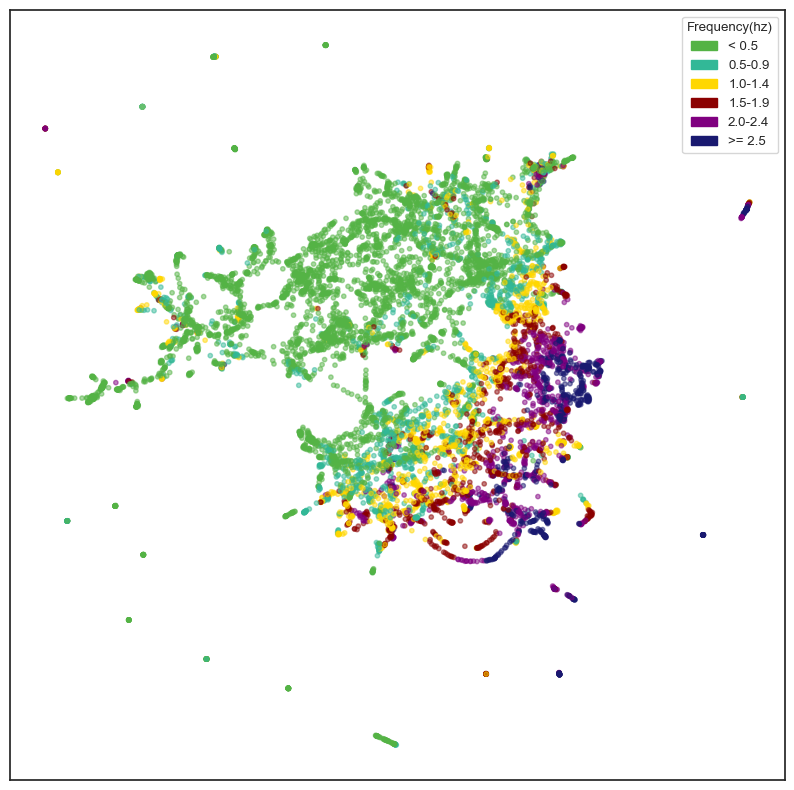

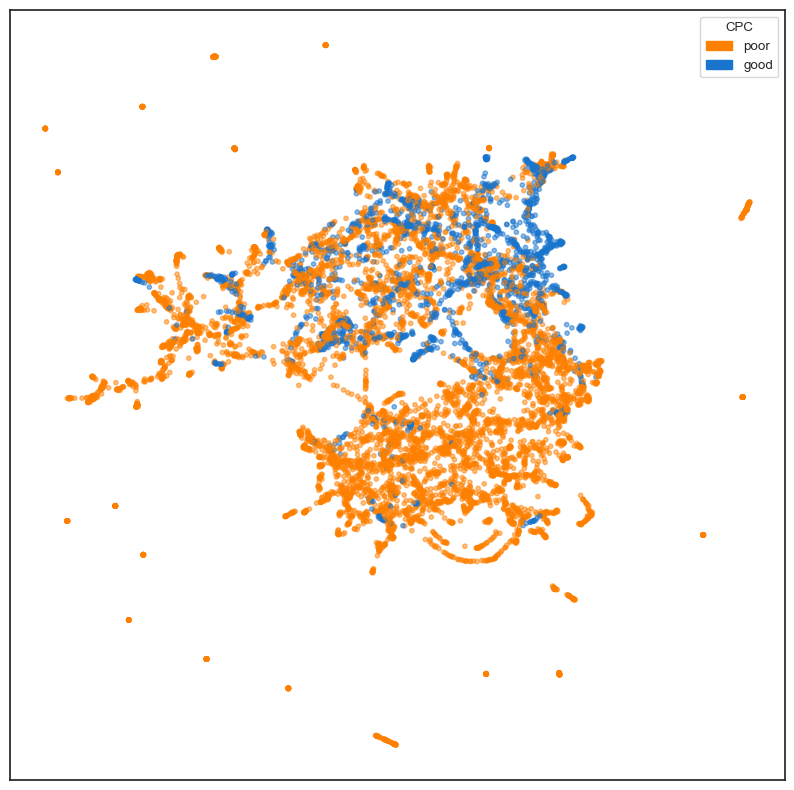

In [55]:
from numpy import array
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import random as rand
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt
from random import choices, sample, seed, randint
from collections import Counter
from matplotlib.lines import Line2D  # for legend handle
from matplotlib.pyplot import figure
from scipy.stats import ranksums
import math

from sklearn.preprocessing import Normalizer,StandardScaler,MinMaxScaler
import pacmap

DATASET = r'Data/hourly_SSD_stats_per_patient_ML_df.csv'
df_raw = pd.read_csv(DATASET)

df_raw.info()
df_raw.dropna(axis=0, inplace=True) # drop NaNs


scale_feats = [
        'SSD_90th','SignalSD','lv_l5','lv_l10','lv_l20','SIQ','SIQ_delta','SIQ_theta','SIQ_alpha',
    'SIQ_beta','BCI','BSAR','d0MaxAmp','d0MeanMaxAmp','d0VarMaxAmp','d0VarMeanAmp',
    'd0VarVarAmp','d0MeanVarAmp','d0MaxMaxFourAmp','d0MeanMaxFourAmp','d0VarMaxFourAmp',
    'd1MaxAmp','d1MeanMaxAmp','d1VarMaxAmp','d1VarMeanAmp','d1VarVarAmp','d1MeanVarAmp',
    'd1MaxMaxFourAmp','d1MeanMaxFourAmp','d1VarMaxFourAmp','d2MaxAmp','d2MeanMaxAmp',
    'd2VarMaxAmp','d2VarMeanAmp','d2VarVarAmp','d2MeanVarAmp','d2MaxMaxFourAmp','d2MeanMaxFourAmp',
    'd2VarMaxFourAmp','linelengthmean','kurtavg','shanavg','nlemean','nleavgstd','deltakurtosis',
    'thetakurtosis','alphakurtosis','betakurtosis','deltameanrat','thetameanrat','alphameanrat',
    'betameanrat','deltaminrat','thetaminrat','alphaminrat','betaminrat','deltastdrat',
    'thetastdrat','alphastdrat','betastdrat','deltapctrat','thetapctrat','alphapctrat',
    'betapctrat','deltathetamean','deltaalphamean','thetaalphamean','deltathetamin',
    'deltaalphamin','thetaalphamin','deltathetastd','deltaalphastd','thetaalphastd',
    'deltathetapct','deltaalphapct','thetaalphapct','meanlogentropy','xcorrmean',
    'xcorrstd','corrmean','geomeanamp','harmmeanamp','meanskewamp','stdskewamp',
    'overallskewamp','meaniqrchannelamp','overalliqramp','avgspectent','sdspectent',
    'pctchangepoint','pctpeakpoint','avgspectkurt','sdspectkurt','meanrms','sdrms'
]

drop_feats = [
    'pat_ID','kmeans_label','selected_cohort','burden_category_hour','pat_freq_group',
    'pat_freq_hour','cpc','cpc_number','EEG_length','CA_to_first_EEG','total_EEG_burden',
    'time','SSD_burden_5','SSD_burden_10','SSD_burden_15','SSD_burden_20','SSD_burden_25',
    'SSD_burden_30','SSD_mean','SSD_85th','SSD_95th','SSD_99th','how_much_array_is_zero'
]

# choose outcome variable
TARGET_NAME = 'cpc'

# choose normalizer
SCALER = MinMaxScaler()

# store outcome variable
target=df_raw[TARGET_NAME]

# drop coluns listed above
df = df_raw.drop(drop_feats, axis = 1)
print('Original dataset class balance: %s' % Counter(target))

df = df.replace([np.inf, -np.inf], np.nan)
df = df.fillna(df.mean())

# df.pat_freq_group = pd.Categorical(df.pat_freq_group)
# df['pat_freq_group'] = df.pat_freq_group.cat.codes
# scale/normalize if needed
scaler = MinMaxScaler()
df[scale_feats] = scaler.fit_transform(df[scale_feats])

# define model
model = pacmap.PaCMAP(intermediate=True,random_state=1989) #MN_ratio=0.2,n_neighbors=500
fitted_model = model.fit_transform(df.values,init="pca")# init="pca"
fitted_model_last_model = fitted_model[-1] # choose last iteration of pacmap
cat_target = target.astype(str)

new_target = df_raw['pat_freq_hour']

fig, ax = plt.subplots(figsize=(10, 10))
colors = {
    '< 0.5':   '#264653',  
    '0.5-0.9': '#287271',  
    '1.0-1.4': '#299D90',  
    '1.5-1.9': '#8AB17D',  
    '2.0-2.4': '#E8C56B',  
    '>= 2.5':  '#E66F51'   
}

colors = {
    '< 0.5': '#54B345' ,
    '0.5-0.9': '#32B897',
    '1.0-1.4': '#FFD700',
    '1.5-1.9': '#8B0000',
    '2.0-2.4': '#800080',
    '>= 2.5': '#191970'
}
ax.scatter(fitted_model_last_model[:, 0], fitted_model_last_model[:, 1], c=new_target.map(colors), s=10,alpha=0.5)
ax.grid(False)
ax.set_xticks([])
ax.set_yticks([])
labels = list(colors.keys())
handles = [plt.Rectangle((0,0),1,1, color=colors[label]) for label in labels]
plt.legend(handles, labels,fontsize='medium',title='Frequency(hz)')

# plt.savefig(r'PCA_freq.jpg')
# plt.savefig(r'PCA_freq.svg')

fig, ax = plt.subplots(figsize=(10, 10))
colors = {'poor':"#FE8000", 'good':"#1974CD"}

ax.scatter(fitted_model_last_model[:, 0], fitted_model_last_model[:, 1], c=target.map(colors), s=10,alpha=0.5)
ax.grid(False)
ax.set_xticks([])
ax.set_yticks([])
labels = list(colors.keys())
handles = [plt.Rectangle((0,0),1,1, color=colors[label]) for label in labels]
plt.legend(handles, labels,fontsize='medium',title='CPC')

plt.savefig(r'PCA_freq_cpc.jpg')
plt.savefig(r'PCA_freq_cpc.svg')


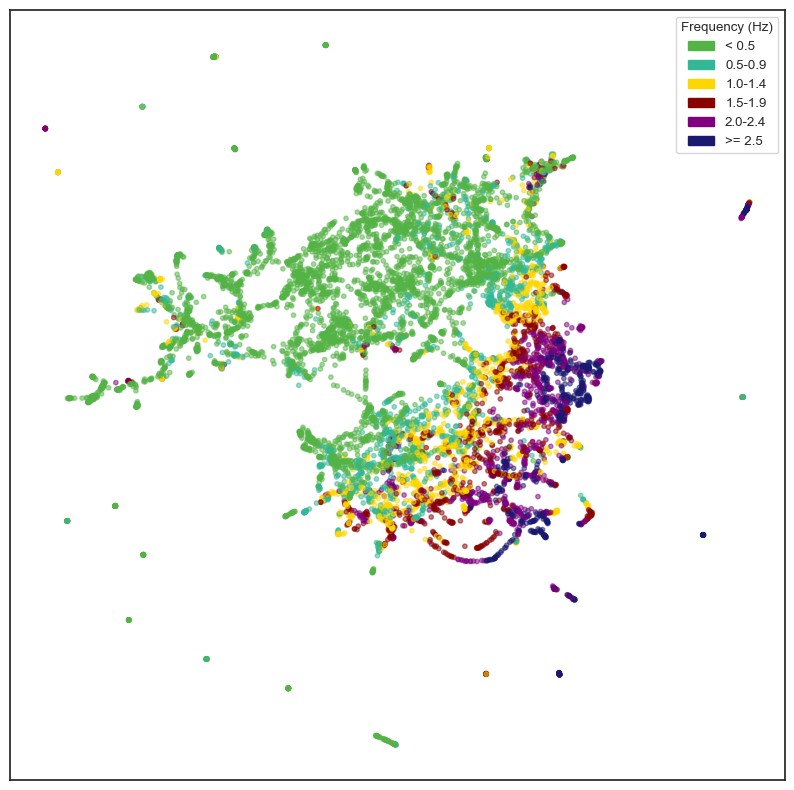

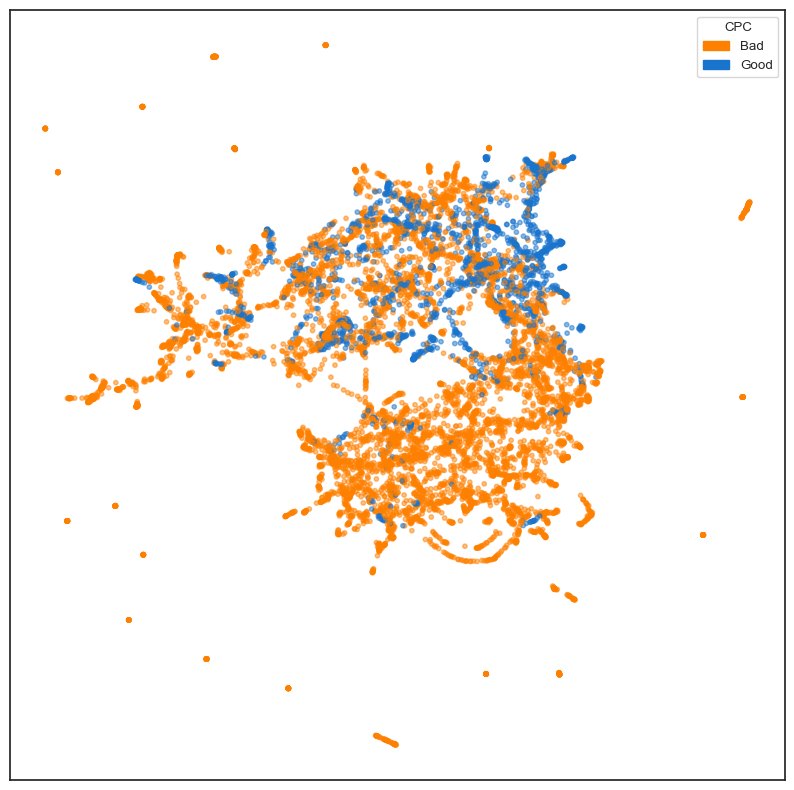

In [57]:
import pandas as pd
import pacmap
import matplotlib.pyplot as plt

# 假设 df, df_raw, target 已经准备好
# df: 用于降维的特征矩阵，shape=(n_samples, n_features)
# df_raw['pat_freq_hour']: 每个样本对应的频率标签
# target: 每个样本对应的 CPC 标签（good/poor）

# === 1. 运行 PaCMAP 降维 ===
model = pacmap.PaCMAP(intermediate=True, random_state=1989)
fitted = model.fit_transform(df.values, init="pca")
# 取最后一次迭代的结果
fitted_last = fitted[-1] if fitted.ndim == 3 else fitted  # 兼容不同输出格式

# === 2. 第一个图：频率分组 ===
freq_colors = {
    '< 0.5': '#54B345' ,
    '0.5-0.9': '#32B897',
    '1.0-1.4': '#FFD700',
    '1.5-1.9': '#8B0000',
    '2.0-2.4': '#800080',
    '>= 2.5': '#191970'
}
# 如果要用第二组配色，取消下面这一行注释
# freq_colors = {'< 0.5':'#54B345','0.5-0.9':'#32B897','1.0-1.4':'#FFD700','1.5-1.9':'#8B0000','2.0-2.4':'#800080','>= 2.5':'#191970'}

fig, ax = plt.subplots(figsize=(10, 10), facecolor='white')
ax.set_facecolor('white')
# 绘制散点
ax.scatter(
    fitted_last[:, 0],
    fitted_last[:, 1],
    c=df_raw['pat_freq_hour'].map(freq_colors),
    s=10,
    alpha=0.5
)
ax.grid(False)
ax.set_xticks([])
ax.set_yticks([])
# 图例
labels = list(freq_colors.keys())
handles = [plt.Rectangle((0, 0), 1, 1, color=freq_colors[l]) for l in labels]
leg = ax.legend(handles, labels, fontsize='medium', title='Frequency (Hz)')
leg.get_frame().set_facecolor('white')

# 如果需要保存：
# plt.savefig('PCA_freq.jpg', facecolor='white')
# plt.savefig('PCA_freq.svg', facecolor='white')

# === 3. 第二个图：CPC 分类 ===
cpc_colors = {'poor': "#FE8000", 'good': "#1974CD"}

fig, ax = plt.subplots(figsize=(10, 10), facecolor='white')
ax.set_facecolor('white')
ax.scatter(
    fitted_last[:, 0],
    fitted_last[:, 1],
    c=target.map(cpc_colors),
    s=10,
    alpha=0.5
)
ax.grid(False)
ax.set_xticks([])
ax.set_yticks([])
handles = [plt.Rectangle((0, 0), 1, 1, color=cpc_colors[l]) for l in ['poor', 'good']]
leg = ax.legend(handles, ['Bad', 'Good'], fontsize='medium', title='CPC')
leg.get_frame().set_facecolor('white')

# 保存文件
plt.savefig('PCA_freq_cpc.jpg', facecolor='white')
plt.savefig('PCA_freq_cpc.svg', facecolor='white')


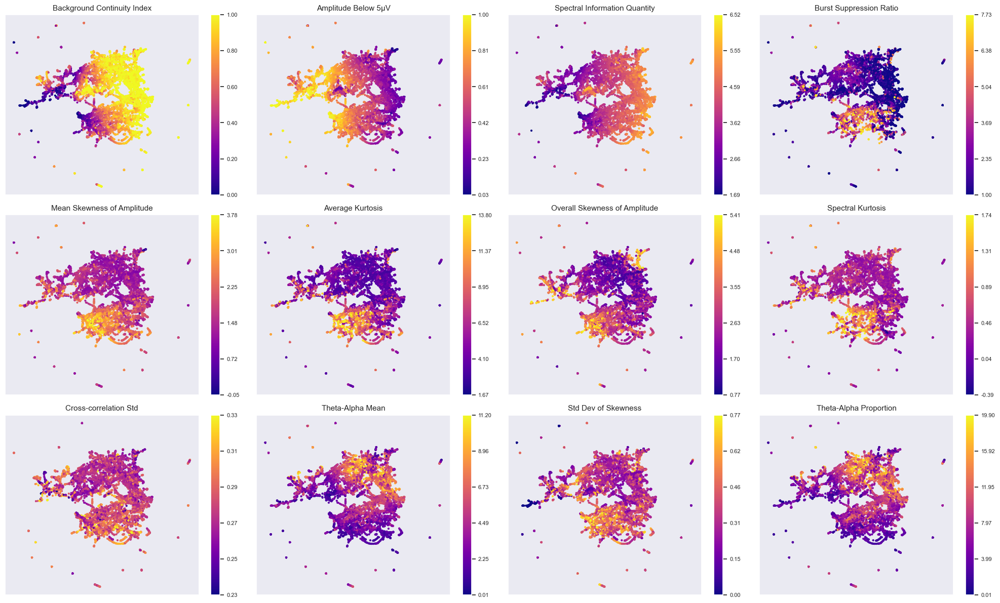

In [7]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from matplotlib.ticker import FormatStrFormatter

# ==== 数据预处理 ====
df_orig = df_raw[scale_feats].copy()
df_orig = df_orig.replace([np.inf, -np.inf], np.nan)
df_orig = df_orig.fillna(df_orig.mean())

# 去极端值（IQR 方法）
Q1 = df_orig.quantile(0.25)
Q3 = df_orig.quantile(0.75)
IQR = Q3 - Q1
df_orig_smooth = df_orig[~((df_orig < (Q1 - 1.5 * IQR)) | (df_orig > (Q3 + 1.5 * IQR)))]

# ==== 特征名与映射 ====
selected_features = [
    'BCI','lv_l5','SIQ','BSAR','meanskewamp', 'kurtavg',
    'overallskewamp', 'avgspectkurt', 'xcorrstd', 'thetaalphamean',
    'stdskewamp', 'thetaalphapct'
]

feature_names = {
    'BCI': 'Background Continuity Index',
    'lv_l5': 'Amplitude Below 5μV',
    'SIQ': 'Spectral Information Quantity',
    'meanskewamp': 'Mean Skewness of Amplitude',
    'kurtavg': 'Average Kurtosis',
    'overallskewamp': 'Overall Skewness of Amplitude',
    'avgspectkurt': 'Spectral Kurtosis',
    'BSAR': 'Burst Suppression Ratio',
    'xcorrstd': 'Cross-correlation Std',
    'thetaalphamean': 'Theta-Alpha Mean',
    'stdskewamp': 'Std Dev of Skewness',
    'thetaalphapct': 'Theta-Alpha Proportion'
}

# ==== 图布局 ====
n_feats = len(selected_features)
ncols = 4
nrows = 3

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(5 * ncols, 4 * nrows))
axs = axs.flatten()

n_ticks = 6  # ✅ 每个 colorbar 保持 6 个刻度

# ==== 每个特征独立 scale，但 colorbar ticks 统一 & 格式化 ====
for i, feature in enumerate(selected_features):
    ax = axs[i]
    vals = df_orig_smooth[feature]
    vmin, vmax = vals.min(), vals.max()
    
    im = ax.scatter(
        fitted_model_last_model[:, 0],
        fitted_model_last_model[:, 1],
        c=vals,
        s=4,
        cmap="plasma",
        vmin=vmin,
        vmax=vmax
    )

    display_name = feature_names.get(feature, feature)
    ax.set_title(display_name, fontsize=11)
    ax.set_xticks([])
    ax.set_yticks([])
    
    # ✅ colorbar with fixed tick count and 2-decimal formatting
    cbar = fig.colorbar(im, ax=ax, ticks=np.linspace(vmin, vmax, n_ticks))
    cbar.ax.tick_params(labelsize=8)
    cbar.ax.yaxis.set_major_formatter(FormatStrFormatter("%.2f"))

# 关闭多余子图
for j in range(n_feats, len(axs)):
    axs[j].axis('off')

plt.tight_layout()
plt.show()


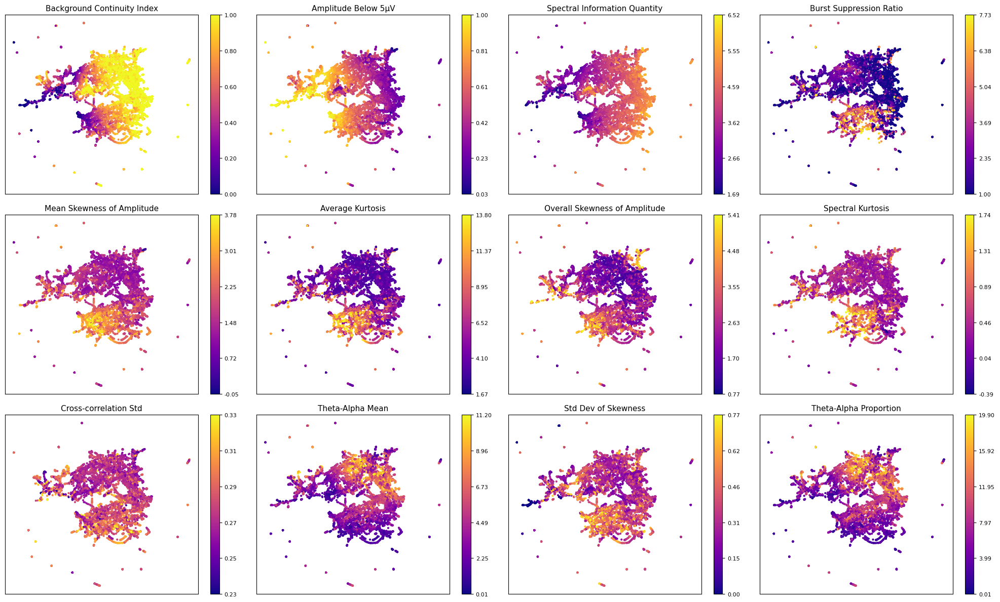

In [7]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from matplotlib.ticker import FormatStrFormatter

# ==== 数据预处理 ====
df_orig = df_raw[scale_feats].copy()
df_orig = df_orig.replace([np.inf, -np.inf], np.nan)
df_orig = df_orig.fillna(df_orig.mean())

# 去极端值（IQR 方法）
Q1 = df_orig.quantile(0.25)
Q3 = df_orig.quantile(0.75)
IQR = Q3 - Q1
df_orig_smooth = df_orig[~((df_orig < (Q1 - 1.5 * IQR)) | (df_orig > (Q3 + 1.5 * IQR)))]

# ==== 特征名与映射 ====
selected_features = [
    'BCI','lv_l5','SIQ','BSAR','meanskewamp', 'kurtavg',
    'overallskewamp', 'avgspectkurt', 'xcorrstd', 'thetaalphamean',
    'stdskewamp', 'thetaalphapct'
]

feature_names = {
    'BCI': 'Background Continuity Index',
    'lv_l5': 'Amplitude Below 5μV',
    'SIQ': 'Spectral Information Quantity',
    'meanskewamp': 'Mean Skewness of Amplitude',
    'kurtavg': 'Average Kurtosis',
    'overallskewamp': 'Overall Skewness of Amplitude',
    'avgspectkurt': 'Spectral Kurtosis',
    'BSAR': 'Burst Suppression Ratio',
    'xcorrstd': 'Cross-correlation Std',
    'thetaalphamean': 'Theta-Alpha Mean',
    'stdskewamp': 'Std Dev of Skewness',
    'thetaalphapct': 'Theta-Alpha Proportion'
}

# ==== 图布局 ====
n_feats = len(selected_features)
ncols = 4
nrows = 3

# ← 在这里给 figure 设置白底
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(5 * ncols, 4 * nrows), facecolor='white')
axs = axs.flatten()

n_ticks = 6  # ✅ 每个 colorbar 保持 6 个刻度

# ==== 每个特征独立 scale，但 colorbar ticks 统一 & 格式化 ====
for i, feature in enumerate(selected_features):
    ax = axs[i]
    # ← 给每个子图也设为白底
    ax.set_facecolor('white')

    vals = df_orig_smooth[feature]
    vmin, vmax = vals.min(), vals.max()
    
    im = ax.scatter(
        fitted_model_last_model[:, 0],
        fitted_model_last_model[:, 1],
        c=vals,
        s=4,
        cmap="plasma",
        vmin=vmin,
        vmax=vmax
    )

    display_name = feature_names.get(feature, feature)
    ax.set_title(display_name, fontsize=11)
    ax.set_xticks([])
    ax.set_yticks([])
    
    # ✅ colorbar with fixed tick count and 2-decimal formatting
    cbar = fig.colorbar(im, ax=ax, ticks=np.linspace(vmin, vmax, n_ticks))
    cbar.ax.tick_params(labelsize=8)
    cbar.ax.yaxis.set_major_formatter(FormatStrFormatter("%.2f"))

# 关闭多余子图
for j in range(n_feats, len(axs)):
    axs[j].axis('off')

plt.tight_layout()
plt.show()


In [45]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier

# ——— Load & clean ———
DATASET = "merged_all_features_clinical.csv"
df = pd.read_csv(DATASET)
df.dropna(axis=0, inplace=True)

# ——— Define feature columns ———
drop_feats = ['pat_ID', 'cluster', 'cpc', 'hour', 'age', 'sex', 'vfib']
feature_columns = [c for c in df.columns if c not in drop_feats]

# —— Print all feature names before ranking ——
print("All feature names:")
print(feature_columns)

# ——— Prepare X and y ———
X    = df[feature_columns].values
y_cpc = df['cpc'].values
y_km  = df['cluster'].values

# ——— Fit models ———
best_params = {'n_estimators':500,'max_depth':10,'min_samples_split':5,'min_samples_leaf':1}
rf_cpc = RandomForestClassifier(**best_params, random_state=42).fit(X, y_cpc)
rf_km  = RandomForestClassifier(**best_params, random_state=42).fit(X, y_km)

# ——— Importances → Series sorted desc ———
imp_cpc = pd.Series(rf_cpc.feature_importances_, index=feature_columns).sort_values(ascending=False)
imp_km  = pd.Series(rf_km.feature_importances_,  index=feature_columns).sort_values(ascending=False)


All feature names:
['BCI', 'BSAR', 'SIQ', 'SIQ_alpha', 'SIQ_beta', 'SIQ_delta', 'SIQ_theta', 'SignalSD', 'alphakurtosis', 'alphameanrat', 'alphaminrat', 'alphapctrat', 'alphastdrat', 'avgspectent', 'avgspectkurt', 'betakurtosis', 'betameanrat', 'betaminrat', 'betapctrat', 'betastdrat', 'corrmean', 'd0MaxAmp', 'd0MaxMaxFourAmp', 'd0MeanMaxAmp', 'd0MeanMaxFourAmp', 'd0MeanVarAmp', 'd0VarMaxAmp', 'd0VarMaxFourAmp', 'd0VarMeanAmp', 'd0VarVarAmp', 'd1MaxAmp', 'd1MaxMaxFourAmp', 'd1MeanMaxAmp', 'd1MeanMaxFourAmp', 'd1MeanVarAmp', 'd1VarMaxAmp', 'd1VarMaxFourAmp', 'd1VarMeanAmp', 'd1VarVarAmp', 'd2MaxAmp', 'd2MaxMaxFourAmp', 'd2MeanMaxAmp', 'd2MeanMaxFourAmp', 'd2MeanVarAmp', 'd2VarMaxAmp', 'd2VarMaxFourAmp', 'd2VarMeanAmp', 'd2VarVarAmp', 'deltaalphamean', 'deltaalphamin', 'deltaalphapct', 'deltaalphastd', 'deltakurtosis', 'deltameanrat', 'deltaminrat', 'deltapctrat', 'deltastdrat', 'deltathetamean', 'deltathetamin', 'deltathetapct', 'deltathetastd', 'geomeanamp', 'harmmeanamp', 'kurtavg', '

In [48]:
import pandas as pd

# ==== 1. 构造特征类别字典 ====
feature_category = {}

spike_features = ['ssd']
for feat in spike_features:
    feature_category[feat] = 'Spike Hz'

amplitude_features = [
    'd0MaxAmp', 'd0MaxMaxFourAmp', 'd0MeanMaxAmp', 'd0MeanMaxFourAmp',
    'd0MeanVarAmp', 'd0VarMaxAmp', 'd0VarMaxFourAmp', 'd0VarMeanAmp', 'd0VarVarAmp',
    'd1MaxAmp', 'd1MaxMaxFourAmp', 'd1MeanMaxAmp', 'd1MeanMaxFourAmp',
    'd1MeanVarAmp', 'd1VarMaxAmp', 'd1VarMaxFourAmp', 'd1VarMeanAmp', 'd1VarVarAmp',
    'd2MaxAmp', 'd2MaxMaxFourAmp', 'd2MeanMaxAmp', 'd2MeanMaxFourAmp',
    'd2MeanVarAmp', 'd2VarMaxAmp', 'd2VarMaxFourAmp', 'd2VarMeanAmp', 'd2VarVarAmp',
    'geomeanamp', 'harmmeanamp', 'meaniqrchannelamp', 'meanrms',
    'meanskewamp', 'overalliqramp', 'overallskewamp', 'stdskewamp',
    'lv_l5', 'lv_l10', 'lv_l20', 'sdrms'
]
for feat in amplitude_features:
    feature_category[feat] = 'Amplitude'

entropy_features = [
    'SIQ', 'SIQ_alpha', 'SIQ_beta', 'SIQ_delta', 'SIQ_theta',
    'meanlogentropy', 'shanavg', 'avgspectent', 'sdspectent'
]
for feat in entropy_features:
    feature_category[feat] = 'Entropy'

feature_category['BCI'] = 'BCI'

# 其余归为 Other
all_features = imp_cpc.index.tolist()
for feat in all_features:
    if feat not in feature_category:
        feature_category[feat] = 'Other'

# ==== 2. 构建两个任务的 DataFrame ====
df_imp_cpc = pd.DataFrame({
    'feature': imp_cpc.index,
    'importance': imp_cpc.values,
    'category': [feature_category[f] for f in imp_cpc.index]
})

df_imp_km = pd.DataFrame({
    'feature': imp_km.index,
    'importance': imp_km.values,
    'category': [feature_category[f] for f in imp_km.index]
})

# ==== 3. 分组计算平均值 ====
cpc_grouped = df_imp_cpc.groupby('category')['importance'].mean().sort_values(ascending=False)
km_grouped  = df_imp_km.groupby('category')['importance'].mean().sort_values(ascending=False)

# ==== 4. 提取 Amplitude Top 10 ====
top10_amp_cpc = df_imp_cpc[df_imp_cpc['category'] == 'Amplitude'].sort_values(by='importance', ascending=False).head(10)
top10_amp_km  = df_imp_km[df_imp_km['category'] == 'Amplitude'].sort_values(by='importance', ascending=False).head(10)

# ==== 5. 输出结果 ====
print("=== CPC Outcome Task — Mean Importance by Category ===")
print(cpc_grouped.round(4))

print("\n=== KMeans Cluster Task — Mean Importance by Category ===")
print(km_grouped.round(4))

print("\n=== Top 10 Amplitude Features (CPC) ===")
print(top10_amp_cpc[['feature', 'importance']].round(4).reset_index(drop=True))

print("\n=== Top 10 Amplitude Features (KMeans) ===")
print(top10_amp_km[['feature', 'importance']].round(4).reset_index(drop=True))


=== CPC Outcome Task — Mean Importance by Category ===
category
Spike Hz     0.0168
BCI          0.0116
Other        0.0112
Amplitude    0.0099
Entropy      0.0090
Name: importance, dtype: float64

=== KMeans Cluster Task — Mean Importance by Category ===
category
Spike Hz     0.0478
Entropy      0.0141
Other        0.0101
BCI          0.0097
Amplitude    0.0093
Name: importance, dtype: float64

=== Top 10 Amplitude Features (CPC) ===
           feature  importance
0      meanskewamp      0.0437
1   overallskewamp      0.0320
2  d2MaxMaxFourAmp      0.0155
3  d1MaxMaxFourAmp      0.0147
4       stdskewamp      0.0127
5  d1VarMaxFourAmp      0.0121
6  d2VarMaxFourAmp      0.0120
7     d2VarMeanAmp      0.0116
8            lv_l5      0.0105
9            sdrms      0.0103

=== Top 10 Amplitude Features (KMeans) ===
            feature  importance
0       meanskewamp      0.0224
1      d2MeanMaxAmp      0.0176
2    overallskewamp      0.0171
3      d1MeanMaxAmp      0.0163
4  d1MeanMaxFour

In [49]:
import pandas as pd

# ==== 1. 构造特征类别字典 ====
feature_category = {}

# Spike Hz
for feat in ['ssd']:
    feature_category[feat] = 'Spike Hz'

# Amplitude
amplitude_features = [
    'd0MaxAmp', 'd0MaxMaxFourAmp', 'd0MeanMaxAmp', 'd0MeanMaxFourAmp',
    'd0MeanVarAmp', 'd0VarMaxAmp', 'd0VarMaxFourAmp', 'd0VarMeanAmp', 'd0VarVarAmp',
    'd1MaxAmp', 'd1MaxMaxFourAmp', 'd1MeanMaxAmp', 'd1MeanMaxFourAmp',
    'd1MeanVarAmp', 'd1VarMaxAmp', 'd1VarMaxFourAmp', 'd1VarMeanAmp', 'd1VarVarAmp',
    'd2MaxAmp', 'd2MaxMaxFourAmp', 'd2MeanMaxAmp', 'd2MeanMaxFourAmp',
    'd2MeanVarAmp', 'd2VarMaxAmp', 'd2VarMaxFourAmp', 'd2VarMeanAmp', 'd2VarVarAmp',
    'geomeanamp', 'harmmeanamp', 'meaniqrchannelamp', 'meanrms',
    'meanskewamp', 'overalliqramp', 'overallskewamp', 'stdskewamp',
    'lv_l5', 'lv_l10', 'lv_l20', 'sdrms'
]
for feat in amplitude_features:
    feature_category[feat] = 'Amplitude'

# Entropy
for feat in [
    'SIQ', 'SIQ_alpha', 'SIQ_beta', 'SIQ_delta', 'SIQ_theta',
    'meanlogentropy', 'shanavg', 'avgspectent', 'sdspectent'
]:
    feature_category[feat] = 'Entropy'

# BCI
feature_category['BCI'] = 'BCI'

# 其余为 Other
all_features = imp_cpc.index.tolist()
for feat in all_features:
    if feat not in feature_category:
        feature_category[feat] = 'Other'

# ==== 2. 构建两个任务的 DataFrame ====
df_imp_cpc = pd.DataFrame({
    'feature': imp_cpc.index,
    'importance': imp_cpc.values,
    'category': [feature_category[f] for f in imp_cpc.index]
})

df_imp_km = pd.DataFrame({
    'feature': imp_km.index,
    'importance': imp_km.values,
    'category': [feature_category[f] for f in imp_km.index]
})

# ==== 3. 自定义均值计算函数 ====
def compute_grouped_importance(df, use_topn_amplitude=10):
    result = {}
    for cat in df['category'].unique():
        group = df[df['category'] == cat]['importance']
        if cat == 'Amplitude':
            result[cat] = group.sort_values(ascending=False).head(use_topn_amplitude).mean()
        else:
            result[cat] = group.mean()
    return pd.Series(result).sort_values(ascending=False)

# ==== 4. 应用 ====
cpc_grouped = compute_grouped_importance(df_imp_cpc, use_topn_amplitude=10)
km_grouped  = compute_grouped_importance(df_imp_km, use_topn_amplitude=10)

# ==== 5. 输出 ====
print("=== CPC Outcome Task — Importance by Category (Amplitude = Top10 Avg) ===")
print(cpc_grouped.round(4))

print("\n=== KMeans Cluster Task — Importance by Category (Amplitude = Top10 Avg) ===")
print(km_grouped.round(4))


=== CPC Outcome Task — Importance by Category (Amplitude = Top10 Avg) ===
Amplitude    0.0175
Spike Hz     0.0168
BCI          0.0116
Other        0.0112
Entropy      0.0090
dtype: float64

=== KMeans Cluster Task — Importance by Category (Amplitude = Top10 Avg) ===
Spike Hz     0.0478
Amplitude    0.0149
Entropy      0.0141
Other        0.0101
BCI          0.0097
dtype: float64


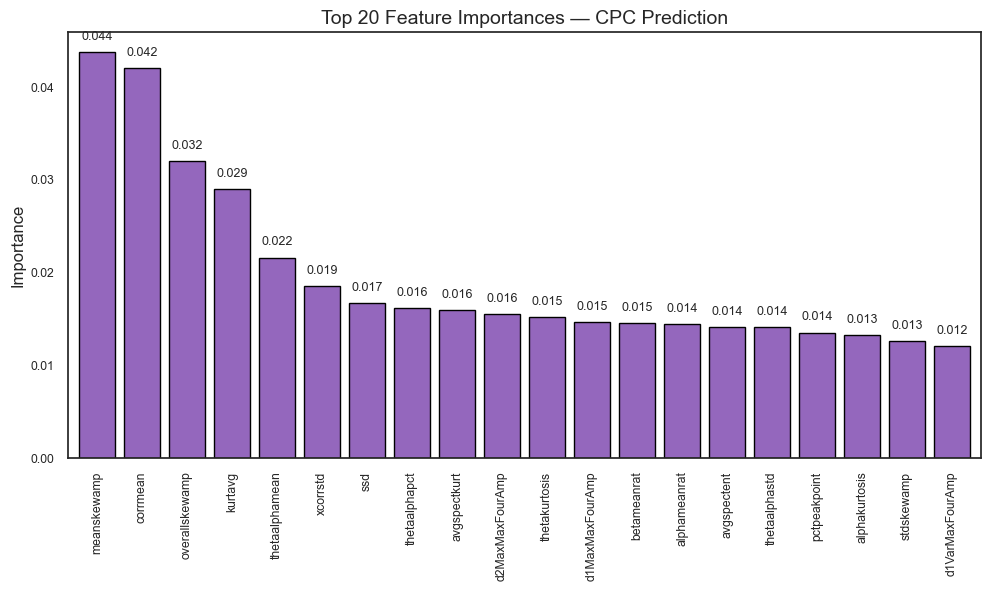

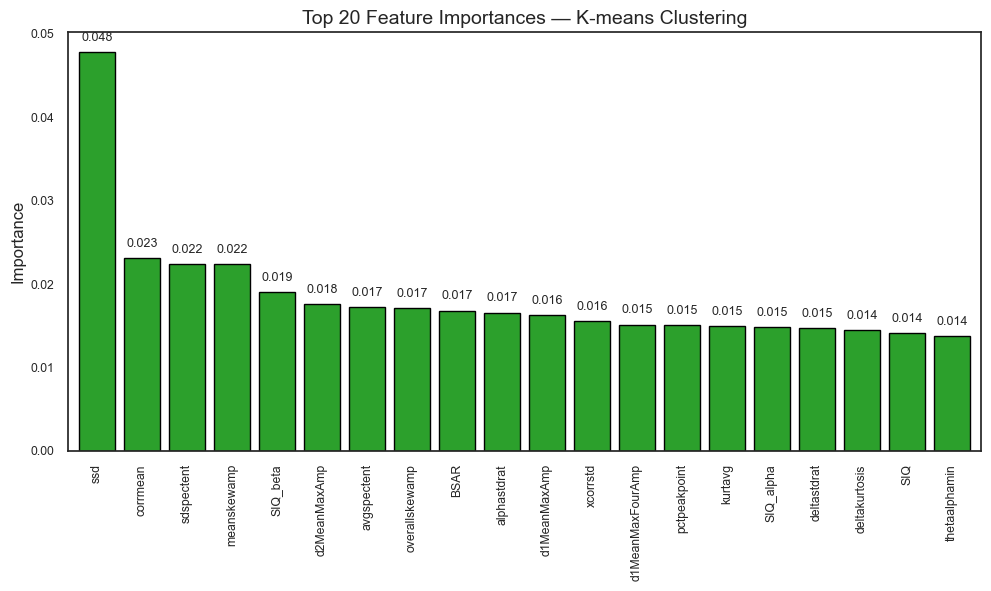

In [50]:
# ——— Plot Top-20 CPC Importances ———
top20_cpc = imp_cpc.head(20)

fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')
top20_cpc.plot.bar(ax=ax, color='tab:purple', edgecolor='black', width=0.8)
ax.set_title("Top 20 Feature Importances — CPC Prediction", fontsize=14)
ax.set_ylabel("Importance", fontsize=12)
ax.set_xlabel("")
ax.tick_params(axis='x', labelrotation=90)
plt.setp(ax.get_xticklabels(), ha='center')

# 添加数值文本（顶部标注）
for i, val in enumerate(top20_cpc.values):
    ax.text(i, val + 0.001, f"{val:.3f}", ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

# ——— Plot Top-20 KMeans Importances ———
top20_km = imp_km.head(20)

fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')
top20_km.plot.bar(ax=ax, color='tab:green', edgecolor='black', width=0.8)
ax.set_title("Top 20 Feature Importances — K-means Clustering", fontsize=14)
ax.set_ylabel("Importance", fontsize=12)
ax.set_xlabel("")
ax.tick_params(axis='x', labelrotation=90)
plt.setp(ax.get_xticklabels(), ha='center')

# 添加数值文本（顶部标注）
for i, val in enumerate(top20_km.values):
    ax.text(i, val + 0.001, f"{val:.3f}", ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()


In [51]:
# ==== Entropy Features in CPC Task ====
entropy_cpc = df_imp_cpc[df_imp_cpc['category'] == 'Entropy']
print("=== Entropy Feature Importances — CPC Task ===")
print(entropy_cpc[['feature', 'importance']].round(4).sort_values(by='importance', ascending=False))

# ==== Entropy Features in KMeans Task ====
entropy_km = df_imp_km[df_imp_km['category'] == 'Entropy']
print("\n=== Entropy Feature Importances — KMeans Task ===")
print(entropy_km[['feature', 'importance']].round(4).sort_values(by='importance', ascending=False))


=== Entropy Feature Importances — CPC Task ===
           feature  importance
14     avgspectent      0.0142
35       SIQ_alpha      0.0098
38       SIQ_theta      0.0097
40      sdspectent      0.0095
41       SIQ_delta      0.0094
47  meanlogentropy      0.0088
57             SIQ      0.0083
66        SIQ_beta      0.0075
93         shanavg      0.0042

=== Entropy Feature Importances — KMeans Task ===
           feature  importance
2       sdspectent      0.0224
4         SIQ_beta      0.0190
6      avgspectent      0.0172
15       SIQ_alpha      0.0148
18             SIQ      0.0141
26       SIQ_delta      0.0124
31  meanlogentropy      0.0114
36       SIQ_theta      0.0102
92         shanavg      0.0050


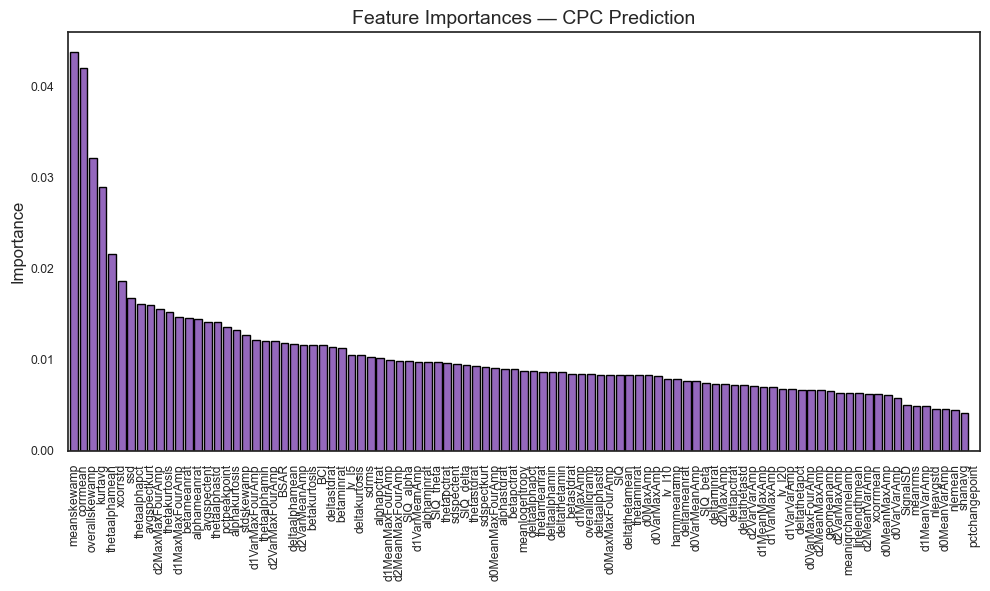

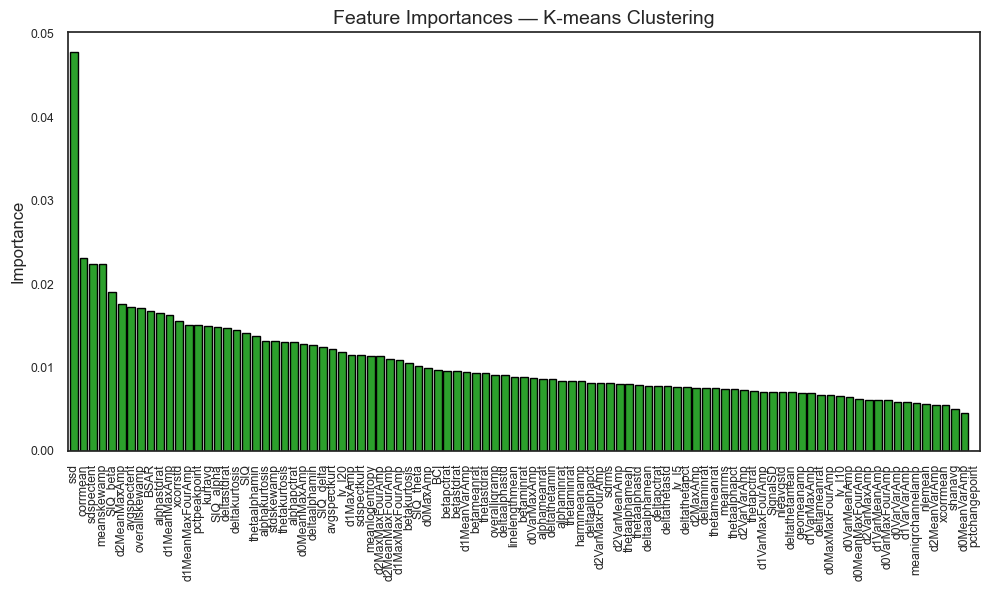

In [38]:
# …上面的训练和 imp_cpc/imp_km 生成代码不变…

# ——— Plot CPC importances ———
fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')
imp_cpc.plot.bar(ax=ax, color='tab:purple', edgecolor='black', width=0.8)
ax.set_title("Feature Importances — CPC Prediction", fontsize=14)
ax.set_ylabel("Importance", fontsize=12)
ax.set_xlabel("")

# 竖着打：标签旋转 90°
ax.tick_params(axis='x', labelrotation=90)
plt.setp(ax.get_xticklabels(), ha='center')

plt.tight_layout()
plt.show()

# ——— Plot KM importances ———
fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')
imp_km.plot.bar(ax=ax, color='tab:green', edgecolor='black', width=0.8)
ax.set_title("Feature Importances — K-means Clustering", fontsize=14)
ax.set_ylabel("Importance", fontsize=12)
ax.set_xlabel("")

ax.tick_params(axis='x', labelrotation=90)
plt.setp(ax.get_xticklabels(), ha='center')

plt.tight_layout()
plt.show()


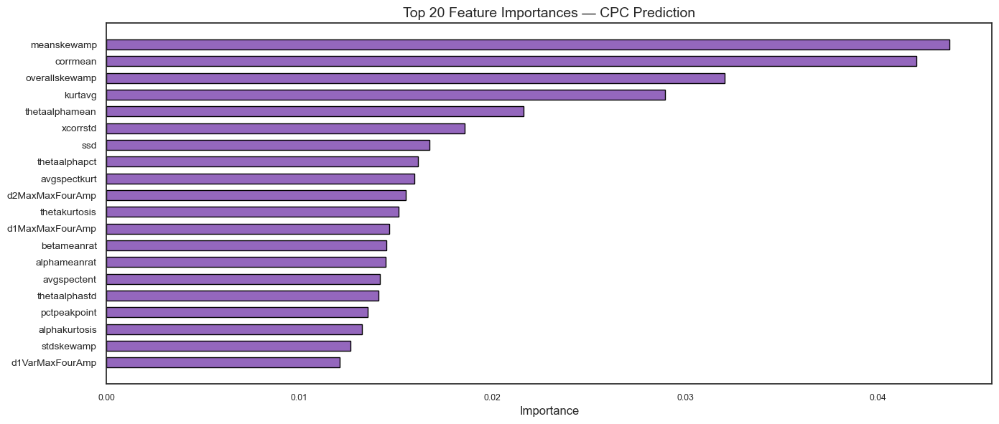

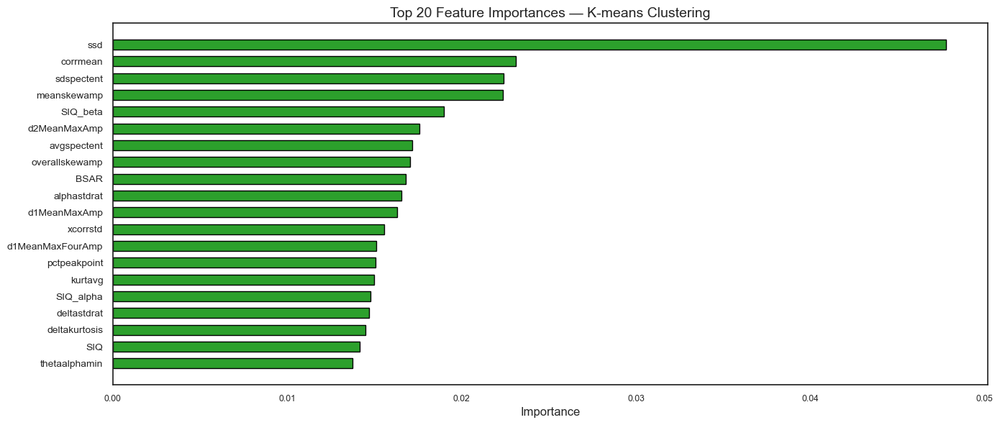

In [42]:
import numpy as np
import matplotlib.pyplot as plt

# 假设 imp_cpc_top20 和 imp_km_top20 已经准备好

for imp_series, title, color in [
    (imp_cpc_top20, "CPC Prediction", "tab:purple"),
    (imp_km_top20,  "K-means Clustering", "tab:green"),
]:
    # 横向长方形画布：宽度大于高度
    fig, ax = plt.subplots(figsize=(14, 6), facecolor='white')
    ax.set_facecolor('white')

    # 自己调用 barh，指定 y 位置和高度
    y_pos = np.arange(len(imp_series))
    ax.barh(
        y=y_pos,
        width=imp_series.values,
        height=0.6,           # 这里不会冲突
        color=color,
        edgecolor='black'
    )
    ax.set_yticks(y_pos)
    ax.set_yticklabels(imp_series.index, fontsize=10)
    ax.invert_yaxis()        # 最重要的排到最上面

    ax.set_xlabel("Importance", fontsize=12)
    ax.set_title(f"Top 20 Feature Importances — {title}", fontsize=14)

    plt.tight_layout()
    plt.show()


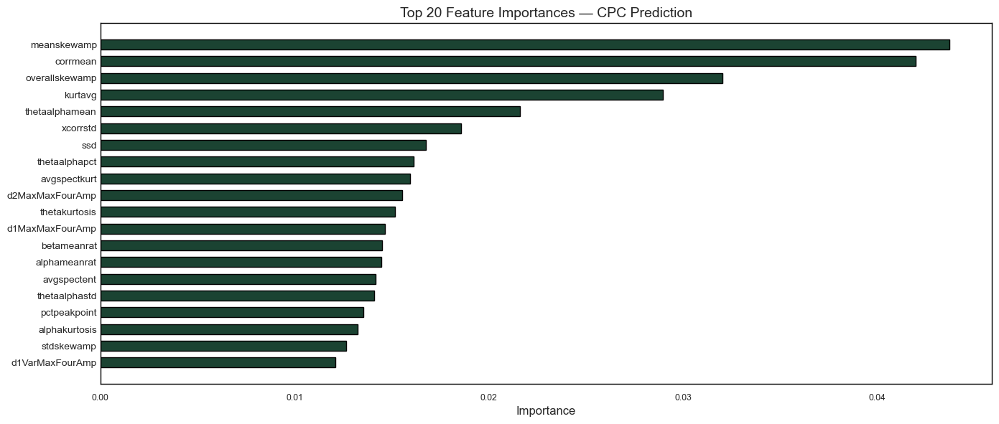

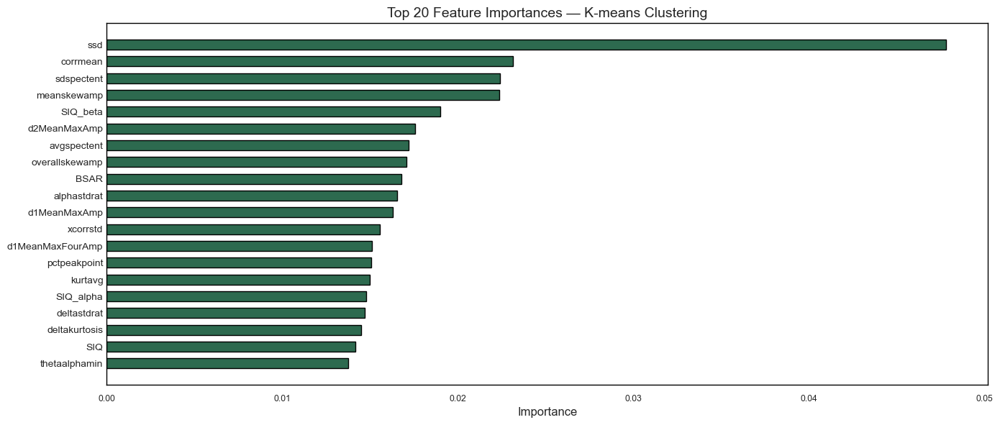

In [67]:
import numpy as np
import matplotlib.pyplot as plt

# 假设 imp_cpc_top20 和 imp_km_top20 已是 pd.Series 类型，index 是 feature name，values 是 importance 分数

# 替代绿色色系（避开 RF 的灰、XGB 的松石绿）
colors = {
    "CPC Prediction": "#1b4332",       # 深森林绿
    "K-means Clustering": "#2d6a4f"    # 橄榄墨绿
}

for imp_series, title in [
    (imp_cpc_top20, "CPC Prediction"),
    (imp_km_top20,  "K-means Clustering"),
]:
    color = colors[title]

    fig, ax = plt.subplots(figsize=(14, 6), facecolor='white')
    ax.set_facecolor('white')

    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_color('black')
        spine.set_linewidth(1)

    y_pos = np.arange(len(imp_series))
    ax.barh(
        y=y_pos,
        width=imp_series.values,
        height=0.6,
        color=color,
        edgecolor='black'
    )

    ax.set_yticks(y_pos)
    ax.set_yticklabels(imp_series.index, fontsize=10)
    ax.invert_yaxis()

    ax.set_xlabel("Importance", fontsize=12)
    ax.set_title(f"Top 20 Feature Importances — {title}", fontsize=14)

    ax.tick_params(axis='x', direction='out', color='black')
    ax.tick_params(axis='y', length=0)

    plt.tight_layout()
    plt.savefig(f"top20_importance_{title.replace(' ', '_')}.png", dpi=300, facecolor='white')
    plt.show()


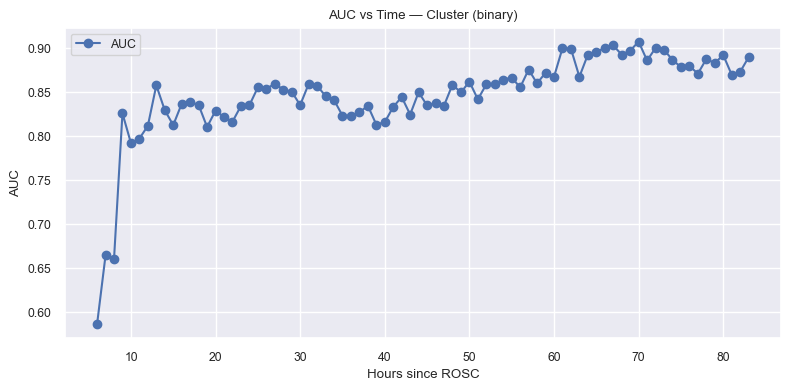

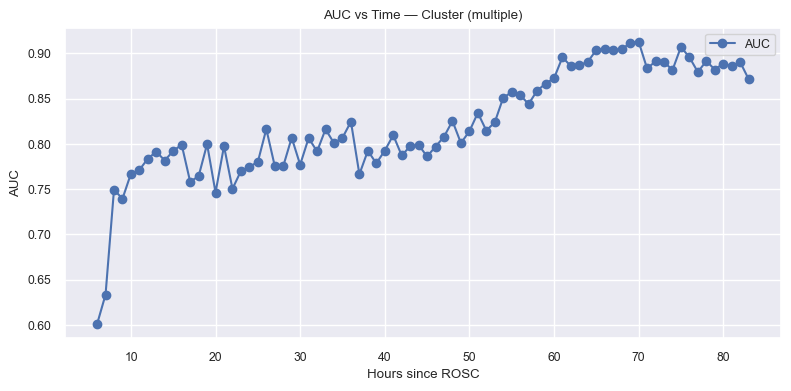

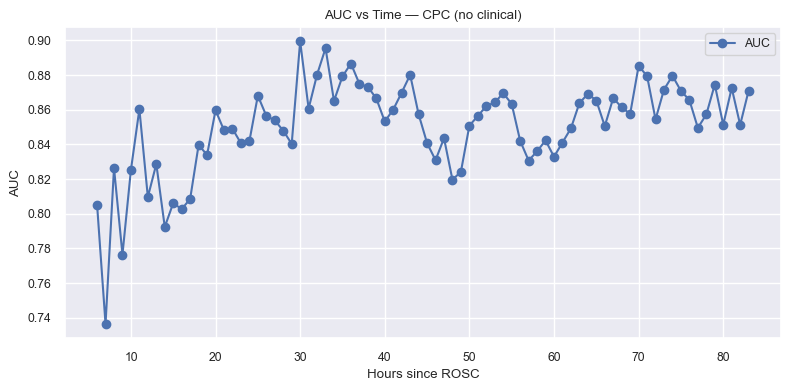

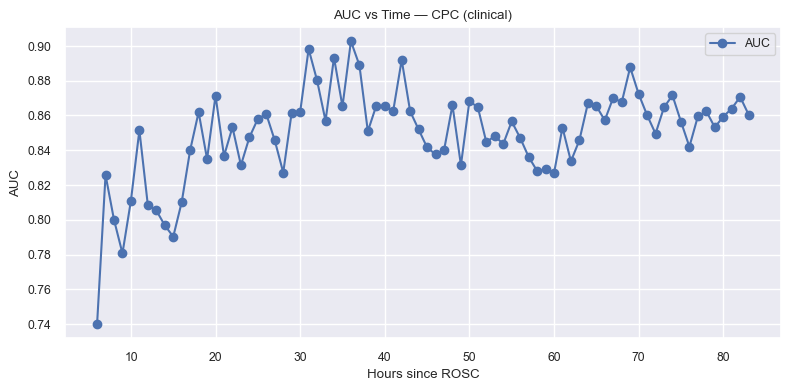

In [16]:
import pandas as pd
import matplotlib.pyplot as plt


file_task_pairs = [
    ("AUC_cluster_bi.csv",  "Cluster (binary)"),
    ("AUC_cluster_mul.csv", "Cluster (multiple)"),
    ("AUC_cpc_nocli.csv",   "CPC (no clinical)"),
    ("AUC_cpc_cli.csv",     "CPC (clinical)"),
]


for file, task in file_task_pairs:
    df = pd.read_csv(file)

    plt.figure(figsize=(8, 4))
    plt.plot(df['hour'], df['AUC'], marker='o', label='AUC')
    plt.xlabel("Hours since ROSC")
    plt.ylabel("AUC")
    plt.title(f"AUC vs Time — {task}")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

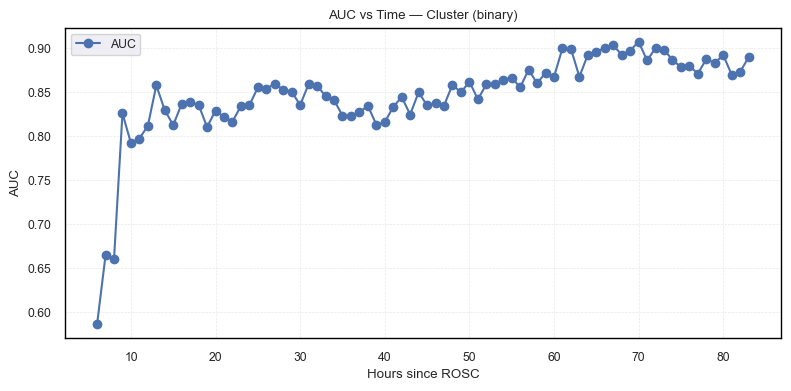

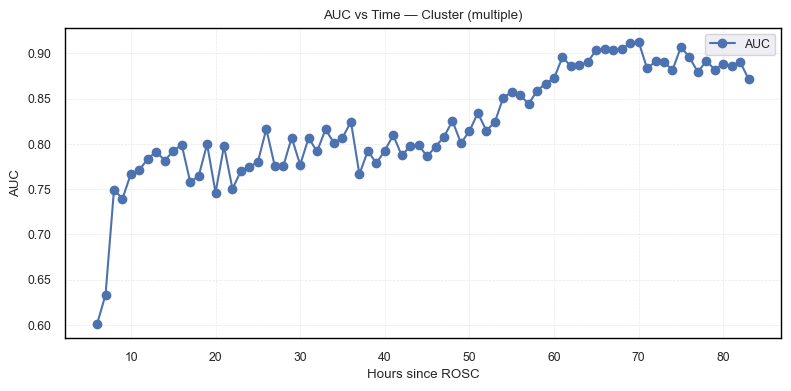

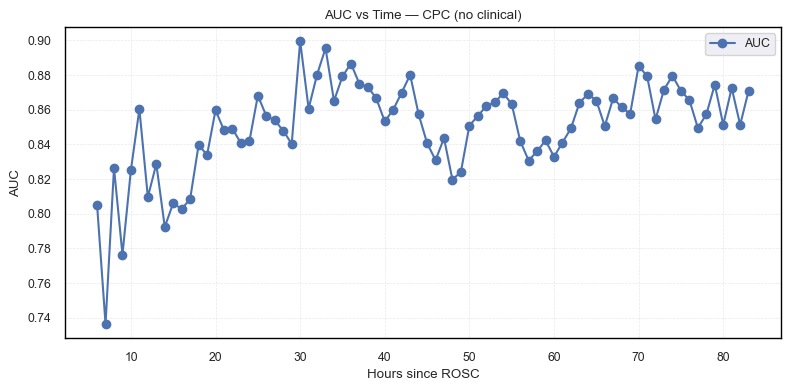

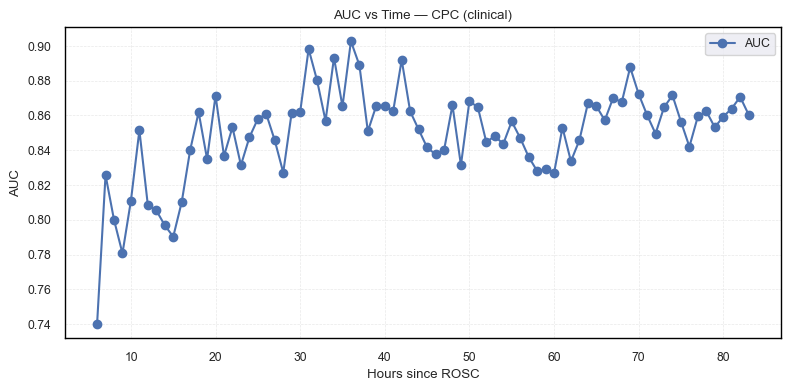

In [21]:
import pandas as pd
import matplotlib.pyplot as plt

# 淡淡的格子样式
grid_kwargs = {
    "visible": True,
    "which": "major",
    "color": "lightgrey",
    "linestyle": "--",
    "linewidth": 0.5,
    "alpha": 0.5
}

file_task_pairs = [
    ("AUC_cluster_bi.csv",  "Cluster (binary)"),
    ("AUC_cluster_mul.csv", "Cluster (multiple)"),
    ("AUC_cpc_nocli.csv",   "CPC (no clinical)"),
    ("AUC_cpc_cli.csv",     "CPC (clinical)"),
]

for file, task in file_task_pairs:
    df = pd.read_csv(file)

    fig, ax = plt.subplots(figsize=(8, 4), facecolor='white')
    ax.set_facecolor('white')

    ax.plot(df['hour'], df['AUC'], marker='o', label='AUC')

    ax.set_xlabel("Hours since ROSC")
    ax.set_ylabel("AUC")
    ax.set_title(f"AUC vs Time — {task}")

    # 淡淡的格子
    ax.grid(**grid_kwargs)

    # 保持四条坐标轴线可见且为黑色
    for spine in ['left', 'bottom', 'right', 'top']:
        ax.spines[spine].set_visible(True)
        ax.spines[spine].set_color('black')
        ax.spines[spine].set_linewidth(1)

    # 刻度朝外
    ax.tick_params(axis='both', which='both', direction='out', color='black')

    ax.legend()
    plt.tight_layout()
    plt.show()


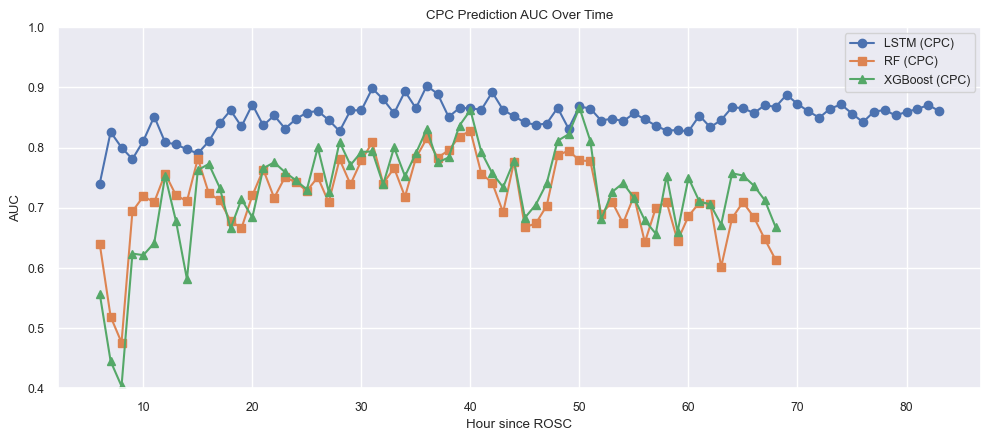

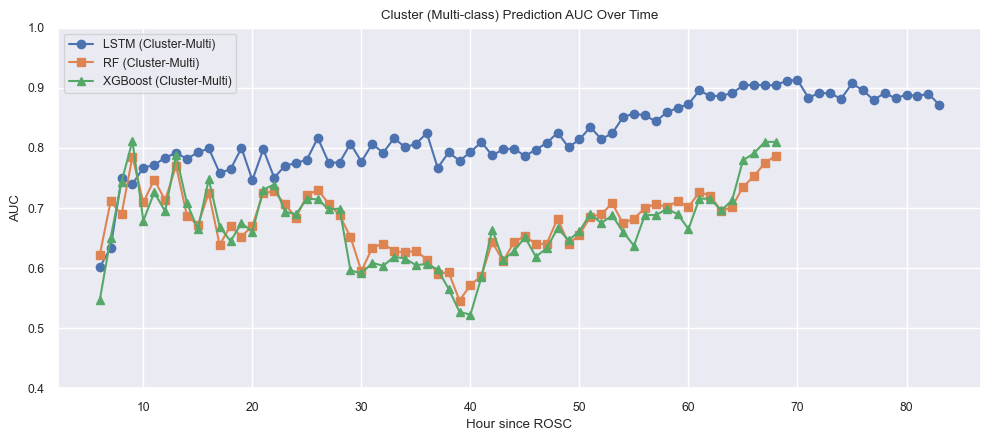

In [17]:
import pandas as pd
import matplotlib.pyplot as plt

# === Load LSTM AUC Data ===
lstm_cpc  = pd.read_csv("AUC_cpc_cli.csv")           # LSTM - CPC (clinical)
lstm_km   = pd.read_csv("AUC_cluster_mul.csv")       # LSTM - Cluster (multi)

# === Load RF / XGBoost AUC Results ===
rf  = pd.read_csv("hourly_rf_optimized_results.csv")
xgb = pd.read_csv("hourly_xgboost_results.csv")

# === Plot 1: CPC AUC ===
plt.figure(figsize=(10, 4.5))
plt.plot(lstm_cpc['hour'], lstm_cpc['AUC'], label='LSTM (CPC)', marker='o')
plt.plot(rf['hour'],  rf['cpc_auc'], label='RF (CPC)', marker='s')
plt.plot(xgb['hour'], xgb['cpc_auc'], label='XGBoost (CPC)', marker='^')
plt.xlabel("Hour since ROSC")
plt.ylabel("AUC")
plt.title("CPC Prediction AUC Over Time")
plt.ylim(0.4, 1.0)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# === Plot 2: Cluster (Multi) AUC ===
plt.figure(figsize=(10, 4.5))
plt.plot(lstm_km['hour'], lstm_km['AUC'], label='LSTM (Cluster-Multi)', marker='o')
plt.plot(rf['hour'],  rf['km_auc'], label='RF (Cluster-Multi)', marker='s')
plt.plot(xgb['hour'], xgb['km_auc'], label='XGBoost (Cluster-Multi)', marker='^')
plt.xlabel("Hour since ROSC")
plt.ylabel("AUC")
plt.title("Cluster (Multi-class) Prediction AUC Over Time")
plt.ylim(0.4, 1.0)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


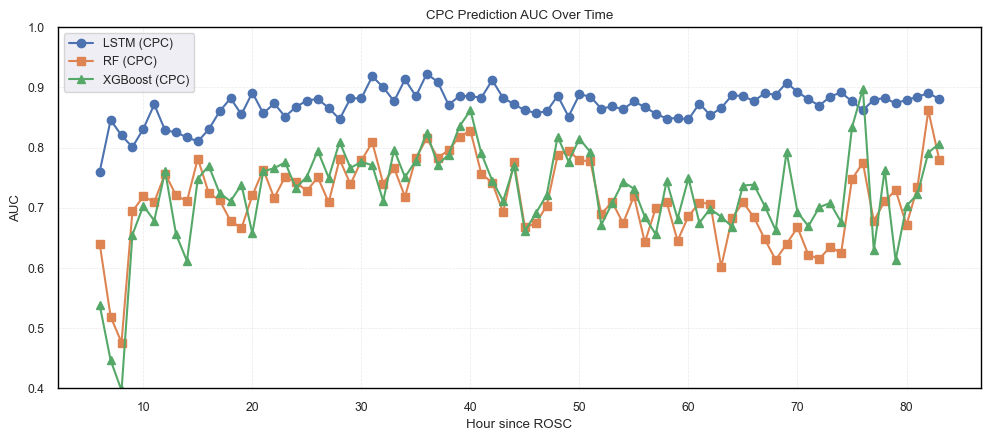

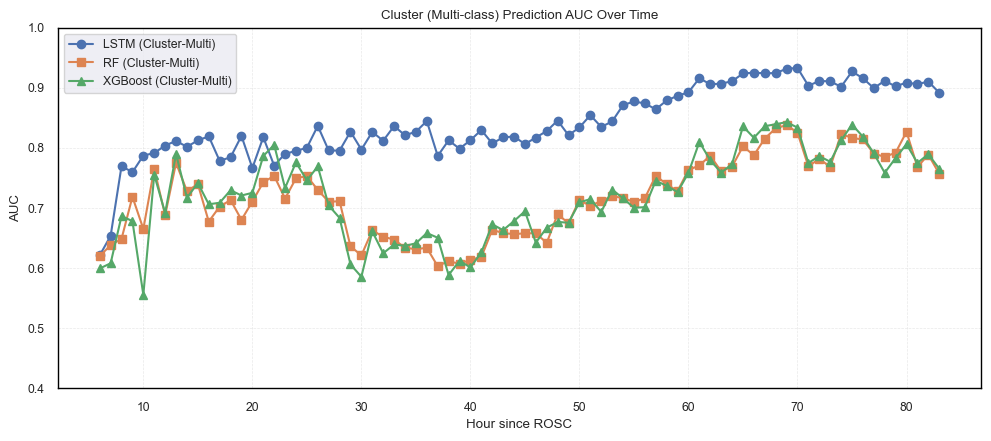

In [26]:
import pandas as pd
import matplotlib.pyplot as plt

# === Load LSTM AUC Data ===
lstm_cpc  = pd.read_csv("AUC_cpc_cli.csv")           # LSTM - CPC (clinical)
lstm_km   = pd.read_csv("AUC_cluster_mul.csv")       # LSTM - Cluster (multi)

# === Load RF / XGBoost AUC Results ===
rf  = pd.read_csv("hourly_rf_optimized_results.csv")
xgb = pd.read_csv("hourly_xgboost_results.csv")

# Common grid style
grid_kwargs = {
    "visible": True,
    "which": "major",
    "color": "lightgrey",
    "linestyle": "--",
    "linewidth": 0.5,
    "alpha": 0.5
}

# === Plot 1: CPC AUC ===
fig, ax = plt.subplots(figsize=(10, 4.5), facecolor='white')
ax.set_facecolor('white')

ax.plot(lstm_cpc['hour'], lstm_cpc['AUC'], label='LSTM (CPC)', marker='o')
ax.plot(rf['hour'],        rf['cpc_auc'],  label='RF (CPC)',  marker='s')
ax.plot(xgb['hour'],       xgb['cpc_auc'], label='XGBoost (CPC)', marker='^')

ax.set_xlabel("Hour since ROSC")
ax.set_ylabel("AUC")
ax.set_title("CPC Prediction AUC Over Time")
ax.set_ylim(0.4, 1.0)

# 淡淡的格子
ax.grid(**grid_kwargs)

# 保持四条轴线可见
for spine in ['left', 'bottom', 'right', 'top']:
    ax.spines[spine].set_visible(True)
    ax.spines[spine].set_color('black')
    ax.spines[spine].set_linewidth(1)

# 恢复刻度线朝外
ax.tick_params(axis='both', which='both', direction='out', color='black')

ax.legend()
plt.tight_layout()
plt.show()

# === Plot 2: Cluster (Multi) AUC ===
fig, ax = plt.subplots(figsize=(10, 4.5), facecolor='white')
ax.set_facecolor('white')

ax.plot(lstm_km['hour'], lstm_km['AUC'], label='LSTM (Cluster-Multi)', marker='o')
ax.plot(rf['hour'],      rf['km_auc'],      label='RF (Cluster-Multi)',      marker='s')
ax.plot(xgb['hour'],     xgb['km_auc'],     label='XGBoost (Cluster-Multi)', marker='^')

ax.set_xlabel("Hour since ROSC")
ax.set_ylabel("AUC")
ax.set_title("Cluster (Multi-class) Prediction AUC Over Time")
ax.set_ylim(0.4, 1.0)

# 淡淡的格子
ax.grid(**grid_kwargs)

for spine in ['left', 'bottom', 'right', 'top']:
    ax.spines[spine].set_visible(True)
    ax.spines[spine].set_color('black')
    ax.spines[spine].set_linewidth(1)

ax.tick_params(axis='both', which='both', direction='out', color='black')

ax.legend()
plt.tight_layout()
plt.show()


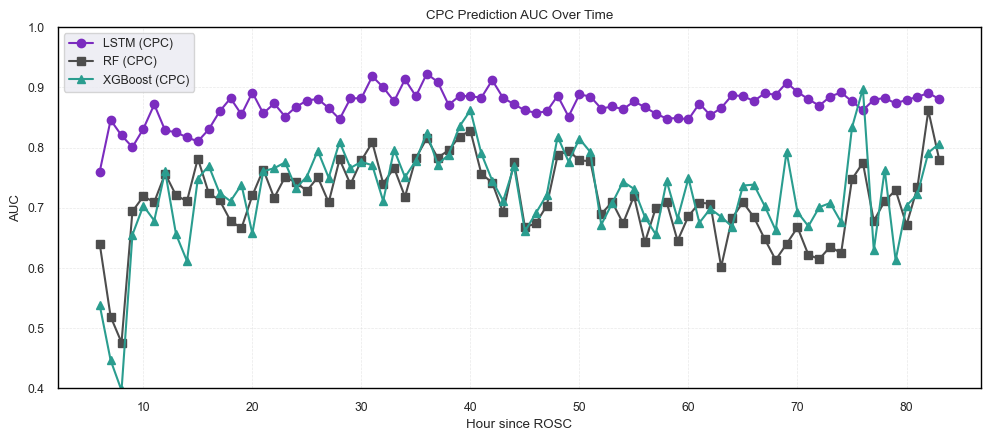

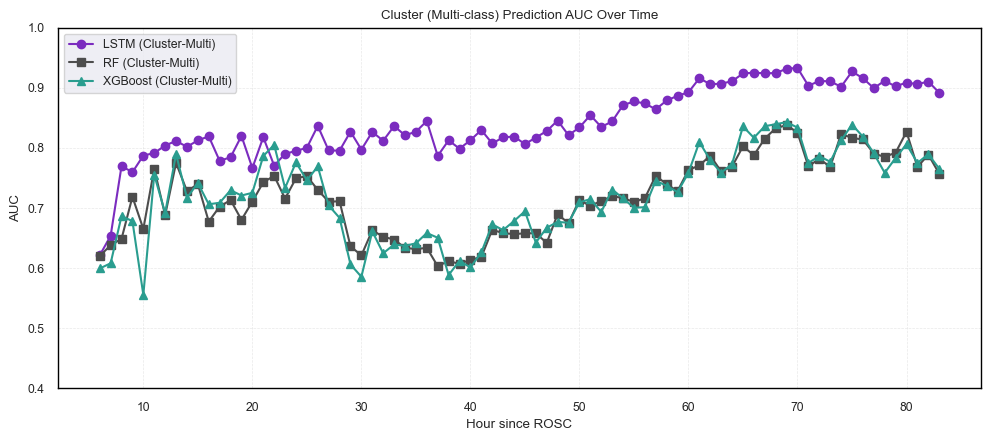

In [65]:
import pandas as pd
import matplotlib.pyplot as plt

# === Load LSTM AUC Data ===
lstm_cpc  = pd.read_csv("AUC_cpc_cli.csv")           # LSTM - CPC (clinical)
lstm_km   = pd.read_csv("AUC_cluster_mul.csv")       # LSTM - Cluster (multi)

# === Load RF / XGBoost AUC Results ===
rf  = pd.read_csv("hourly_rf_optimized_results.csv")
xgb = pd.read_csv("hourly_xgboost_results.csv")

# New color scheme (distinct from previous plots)
colors = {
    "LSTM": "#7B2CBF",     # Purple
    "RF":   "#4D4D4D",     # Dark gray
    "XGB":  "#2A9D8F"      # Teal / turquoise
}

grid_kwargs = {
    "visible": True,
    "which": "major",
    "color": "lightgrey",
    "linestyle": "--",
    "linewidth": 0.5,
    "alpha": 0.5
}

# === Plot 1: CPC AUC ===
fig, ax = plt.subplots(figsize=(10, 4.5), facecolor='white')
ax.set_facecolor('white')

ax.plot(lstm_cpc['hour'], lstm_cpc['AUC'], label='LSTM (CPC)', color=colors["LSTM"], marker='o')
ax.plot(rf['hour'],        rf['cpc_auc'],  label='RF (CPC)',    color=colors["RF"],   marker='s')
ax.plot(xgb['hour'],       xgb['cpc_auc'], label='XGBoost (CPC)', color=colors["XGB"], marker='^')

ax.set_xlabel("Hour since ROSC")
ax.set_ylabel("AUC")
ax.set_title("CPC Prediction AUC Over Time")
ax.set_ylim(0.4, 1.0)
ax.grid(**grid_kwargs)

for spine in ['left', 'bottom', 'right', 'top']:
    ax.spines[spine].set_visible(True)
    ax.spines[spine].set_color('black')
    ax.spines[spine].set_linewidth(1)

ax.tick_params(axis='both', which='both', direction='out', color='black')
ax.legend()
plt.tight_layout()
plt.savefig("AUC_CPC_comparison.png", dpi=300, facecolor='white')
plt.show()

# === Plot 2: Cluster AUC ===
fig, ax = plt.subplots(figsize=(10, 4.5), facecolor='white')
ax.set_facecolor('white')

ax.plot(lstm_km['hour'], lstm_km['AUC'], label='LSTM (Cluster-Multi)', color=colors["LSTM"], marker='o')
ax.plot(rf['hour'],      rf['km_auc'],  label='RF (Cluster-Multi)',    color=colors["RF"],   marker='s')
ax.plot(xgb['hour'],     xgb['km_auc'], label='XGBoost (Cluster-Multi)', color=colors["XGB"], marker='^')

ax.set_xlabel("Hour since ROSC")
ax.set_ylabel("AUC")
ax.set_title("Cluster (Multi-class) Prediction AUC Over Time")
ax.set_ylim(0.4, 1.0)
ax.grid(**grid_kwargs)

for spine in ['left', 'bottom', 'right', 'top']:
    ax.spines[spine].set_visible(True)
    ax.spines[spine].set_color('black')
    ax.spines[spine].set_linewidth(1)

ax.tick_params(axis='both', which='both', direction='out', color='black')
ax.legend()
plt.tight_layout()
plt.savefig("AUC_Cluster_comparison.png", dpi=300, facecolor='white')
plt.show()


C:\Users\admin\AppData\Local\Temp\ipykernel_30180\2926150226.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=0.5)


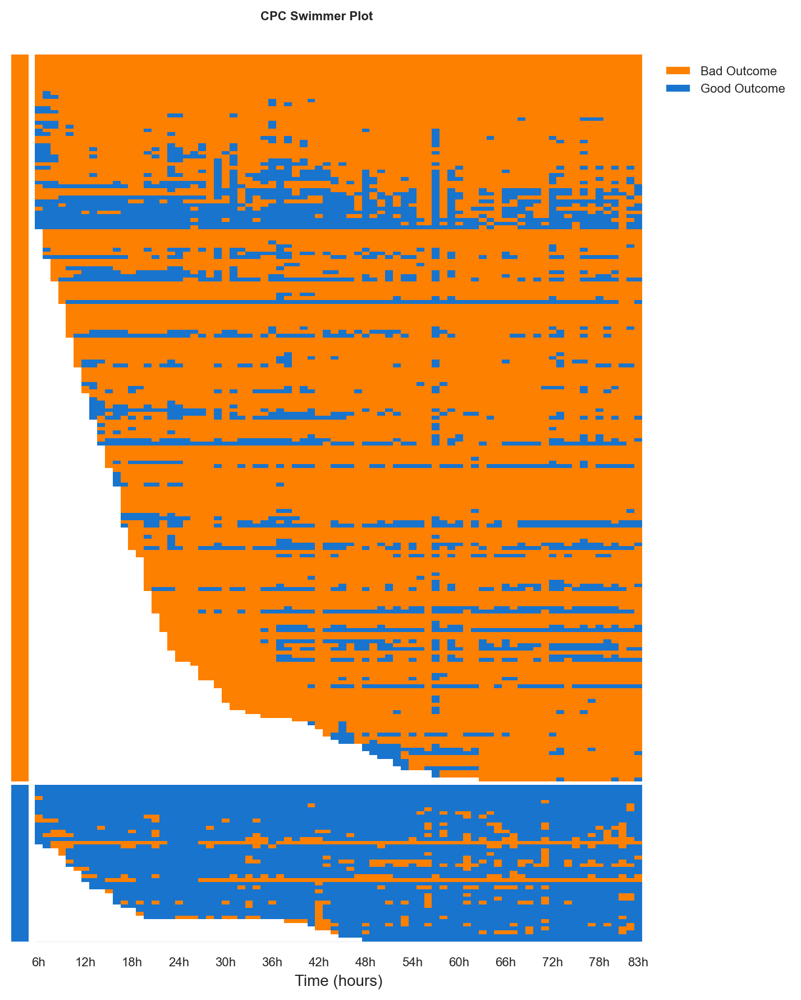

In [22]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.patches import Rectangle
from matplotlib.gridspec import GridSpec

# === 1. Read in full_preds.csv ===
df = pd.read_csv("full_preds_cpc.csv")

# === 2. Compute each patient's overall accuracy and sort ===
acc_df = (
    df
    .assign(correct=lambda d: d['pred_label'] == d['true_label'])
    .groupby('pat_ID')['correct']
    .agg(['sum', 'count'])
    .assign(acc=lambda x: x['sum'] / x['count'])
    .reset_index()[['pat_ID', 'acc']]
)
first_df = (
    df
    .dropna(subset=['pred_label'])
    .groupby('pat_ID')['hour']
    .min()
    .reset_index()
    .rename(columns={'hour': 'first_time'})
)
patients = (
    df[['pat_ID', 'true_label']]
      .drop_duplicates()
      .merge(acc_df, on='pat_ID')
      .merge(first_df, on='pat_ID')
      .sort_values(
          ['true_label', 'first_time', 'acc'],
          ascending=[True, True, False]
      )
      .reset_index(drop=True)
)

# === 3. Group by true_label and insert a gap at the end of each group ===
groups = patients.groupby('true_label')['pat_ID'].apply(list)
new_order = []
new_true = []
for lbl in sorted(groups.index):            # first 0, then 1
    ids = groups[lbl]
    new_order += ids
    new_true += [lbl] * len(ids)
    # insert a gap (use None, which becomes NaN later)
    new_order.append(None)
    new_true.append(np.nan)
# remove the last extra gap
new_order = new_order[:-1]
new_true  = new_true[:-1]

# === 4. Pivot the predictions matrix and reindex with the gap ===
df_pivot = df.pivot(index='pat_ID', columns='hour', values='pred_label')
df_pivot_exp = df_pivot.reindex(new_order)  # None maps to an all-NaN row
time_axis = sorted(df['hour'].unique())
df_pivot_exp = df_pivot_exp.reindex(columns=time_axis)

# === 5. Prepare colormap and normalization ===
cmap_lab = ListedColormap(['#fe8000','#1974cd'])
# display NaNs as white rows
cmap_lab.set_bad(color='white')
norm = BoundaryNorm([-0.5, 0.5, 1.5], cmap_lab.N)

# === 6. Plot ===
fig = plt.figure(figsize=(7.25, 9.75), dpi=200)
# move the main title down a bit, e.g., y=0.96
fig.suptitle("CPC Swimmer Plot", fontsize=8, weight='bold', y=0.96)
# tighten top and bottom margins
plt.subplots_adjust(top=0.92)

gs  = GridSpec(1, 2, width_ratios=[0.2, 7], wspace=0.02, figure=fig)
ax_strip = fig.add_subplot(gs[0])
ax_main  = fig.add_subplot(gs[1], sharey=ax_strip)

# Left: true label color strip (with gap)
strip = np.array(new_true)[:, None]
ax_strip.imshow(
    np.ma.masked_invalid(strip),
    aspect='auto',
    cmap=cmap_lab,
    norm=norm,
    interpolation='nearest'
)
ax_strip.axis('off')

# Right: prediction heatmap (with gap)
im = ax_main.imshow(
    np.ma.masked_invalid(df_pivot_exp.values),
    aspect='auto',
    cmap=cmap_lab,
    norm=norm,
    interpolation='nearest'
)
ax_main.grid(False)

# align y-limits on both strips
ax_strip.set_ylim(ax_main.get_ylim())

# X-axis ticks
xt = np.arange(len(time_axis))
# label every 6 hours, leave others blank
#xl = [f"{h}h" if h % 6 == 0 else "" for h in time_axis]
xl = [
     f"{h}h" 
     if (h % 6 == 0 or h == time_axis[0] or h == time_axis[-1]) 
     else "" 
     for h in time_axis
 ]
ax_main.set_xticks(xt)
ax_main.set_xticklabels(xl, fontsize=8)
ax_main.set_xlabel("Time (hours)", fontsize=10)

# hide Y-axis and all spines
ax_main.set_yticks([])
for sp in list(ax_main.spines.values()) + list(ax_strip.spines.values()):
    sp.set_visible(False)

# Legend
pred_patch = [
    Rectangle((0, 0), 1, 1, facecolor='#fe8000', label='Bad Outcome'),
    Rectangle((0, 0), 1, 1, facecolor='#1974cd' , label='Good Outcome')
]
ax_main.legend(
    handles=pred_patch,
    bbox_to_anchor=(1.02, 1.0),
    loc='upper left',
    fontsize=8,
    frameon=False
)

plt.tight_layout(pad=0.5)
# save as high-resolution JPEG
fig.savefig("CPC_swimmer_plot.jpg", dpi=600, bbox_inches='tight')
# save as SVG vector graphic
fig.savefig("CPC_swimmer_plot.svg", format='svg', bbox_inches='tight')
plt.show()



C:\Users\admin\AppData\Local\Temp\ipykernel_30180\3494698537.py:148: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=0.5)


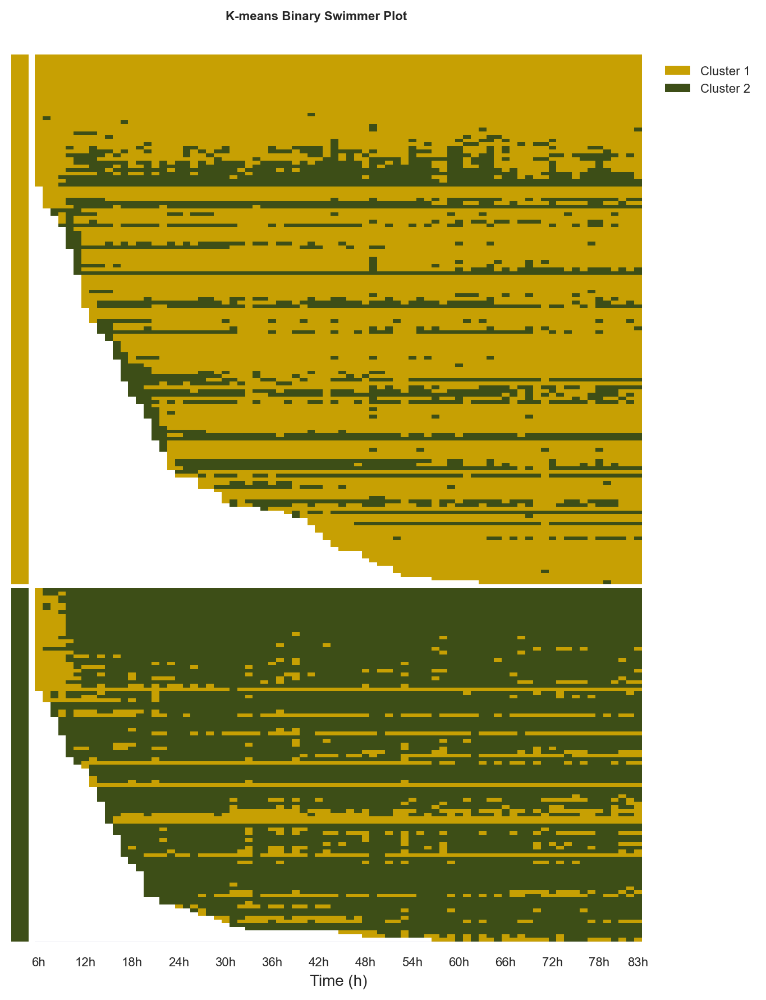

In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.patches import Rectangle
from matplotlib.gridspec import GridSpec

# === 1. Read in full_preds_Kb.csv ===
df = pd.read_csv("full_preds_Kb.csv")

# === 2. Compute each patient’s overall accuracy & sort ===
acc_df = (
    df
    .assign(correct=lambda d: d['pred_label'] == d['true_label'])
    .groupby('pat_ID')['correct']
    .agg(['sum','count'])
    .assign(acc=lambda x: x['sum'] / x['count'])
    .reset_index()[['pat_ID','acc']]
)

first_df = (
    df
    .dropna(subset=['pred_label'])
    .groupby('pat_ID')['hour']
    .min()
    .reset_index()
    .rename(columns={'hour':'first_time'})
)

patients = (
    df[['pat_ID','true_label']]
      .drop_duplicates()
      .merge(acc_df,   on='pat_ID')
      .merge(first_df, on='pat_ID')
      .sort_values(
          ['true_label','first_time','acc'],
          ascending=[True,       True,        False]
      )
)

# === 3. Insert a gap at the end of each true_label group ===
groups     = patients.groupby('true_label')['pat_ID'].apply(list)
new_order  = []
new_true   = []
for lbl in sorted(groups.index):
    ids = groups[lbl]
    new_order += ids
    new_true  += [lbl] * len(ids)
    new_order.append(None)     # placeholder for gap
    new_true.append(np.nan)
# Remove the final extra gap
new_order = new_order[:-1]
new_true  = new_true[:-1]

# === 4. Pivot the prediction matrix & reindex (including gap) ===
df_pivot = df.pivot(index='pat_ID', columns='hour', values='pred_label')
df_pivot_exp = df_pivot.reindex(new_order)
time_axis    = sorted(df['hour'].unique())
df_pivot_exp = df_pivot_exp.reindex(columns=time_axis)

# === 5. Prepare discrete colormap & normalization ===
all_lbls  = sorted(set(new_true) - {np.nan})
n_classes = len(all_lbls)

custom_colors = {
    0: '#C7A003',  
    1: '#3D4E17',  
}
#['#30688D', '#91D566'] Green
colors = [custom_colors[lbl] for lbl in all_lbls]

cmap_disc = ListedColormap(colors)
cmap_disc.set_bad(color='white') 

bounds = np.arange(-0.5, n_classes + 0.5, 1)
norm   = BoundaryNorm(bounds, cmap_disc.N)


# === 6. Create figure + GridSpec (narrow strip + main plot) ===
fig = plt.figure(figsize=(7.25, 9.75), dpi=200)
# move the title down a bit, e.g., y=0.96
fig.suptitle("K-means Binary Swimmer Plot", fontsize=8, weight='bold', y=0.96)
# tighten top margin
plt.subplots_adjust(top=0.92)

gs  = GridSpec(1, 2, width_ratios=[0.2, 7], wspace=0.02, figure=fig)
ax_strip = fig.add_subplot(gs[0])
ax_main  = fig.add_subplot(gs[1], sharey=ax_strip)

# === 7. Left: true label color strip (with gap) ===
strip_arr = np.array(new_true)[:, None]
ax_strip.imshow(
    np.ma.masked_invalid(strip_arr),
    aspect='auto',
    cmap=cmap_disc,
    norm=norm,
    interpolation='nearest'
)
ax_strip.axis('off')

# === 8. Right: predicted label heatmap (with gap) ===
data_masked = np.ma.masked_invalid(df_pivot_exp.values)
im = ax_main.imshow(
    data_masked,
    aspect='auto',
    cmap=cmap_disc,
    norm=norm,
    interpolation='nearest'
)
ax_main.grid(False)

# ensure top/bottom alignment
ax_strip.set_ylim(ax_main.get_ylim())

# === 9. X-axis ticks ===
xt = np.arange(len(time_axis))
#xl = [f"{h}h" if h % 6 == 0 else "" for h in time_axis]
xl = [
     f"{h}h" 
     if (h % 6 == 0 or h == time_axis[0] or h == time_axis[-1]) 
     else "" 
     for h in time_axis
 ]
ax_main.set_xticks(xt)
ax_main.set_xticklabels(xl, fontsize=8)
ax_main.set_xlabel("Time (h)", fontsize=10)

# === 10. Remove Y-axis & spines ===
ax_main.set_yticks([])
for sp in list(ax_main.spines.values()) + list(ax_strip.spines.values()):
    sp.set_visible(False)

# === 11. Legend: generate a patch for each cluster ===
legend_patches = []
for i, lbl in enumerate(all_lbls):
    legend_patches.append(
        Rectangle((0, 0), 1, 1, facecolor=colors[i], edgecolor='none',
                  label=f"Cluster {int(lbl) + 1}")
    )
ax_main.legend(
    handles=legend_patches,
    bbox_to_anchor=(1.02, 1.0),
    loc='upper left',
    fontsize=8,
    frameon=False
)

plt.tight_layout(pad=0.5)
# save as high-resolution JPEG
fig.savefig("KmeansBinary_swimmer_plot.jpg", dpi=600, bbox_inches='tight')
# save as SVG vector graphic
fig.savefig("KmeansBinary_swimmer_plot.svg", format='svg', bbox_inches='tight')
plt.show()


C:\Users\admin\AppData\Local\Temp\ipykernel_30180\4178686110.py:136: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=0.5)


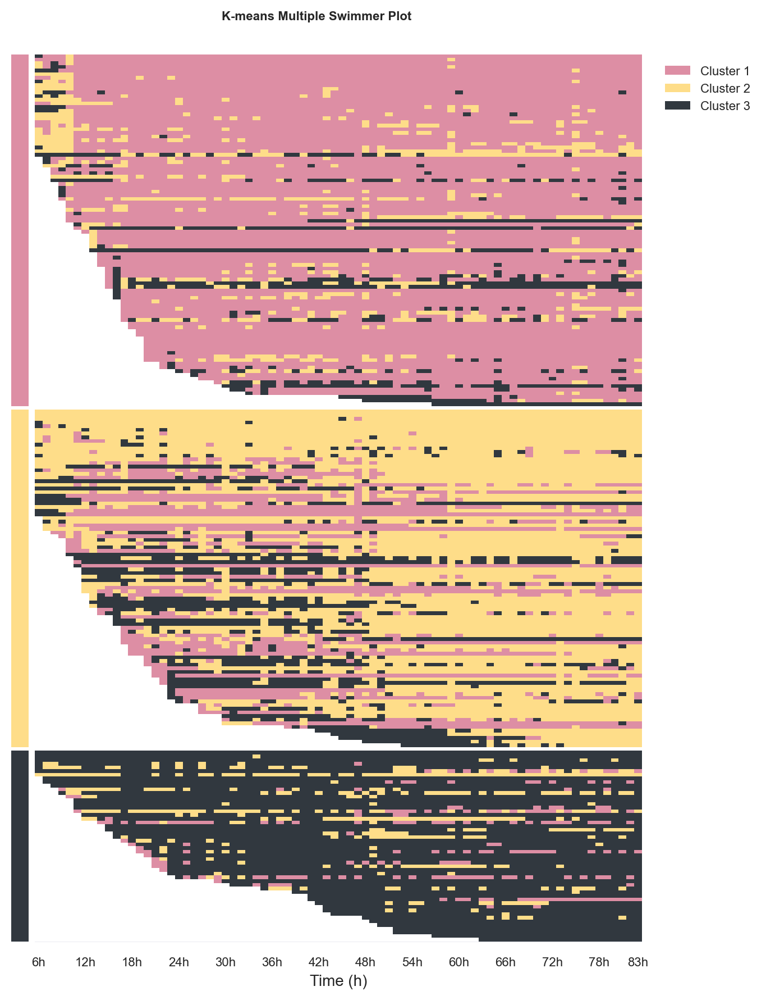

In [24]:
# === 1. Read in full_preds_Km.csv ===
df = pd.read_csv("full_preds_Km.csv")

# === 2. Compute each patient’s overall accuracy & sort ===
acc_df = (
    df
    .assign(correct=lambda d: d['pred_label'] == d['true_label'])
    .groupby('pat_ID')['correct']
    .agg(['sum','count'])
    .assign(acc=lambda x: x['sum'] / x['count'])
    .reset_index()[['pat_ID','acc']]
)

first_df = (
    df
    .dropna(subset=['pred_label'])
    .groupby('pat_ID')['hour']
    .min()
    .reset_index()
    .rename(columns={'hour':'first_time'})
)

patients = (
    df[['pat_ID','true_label']]
      .drop_duplicates()
      .merge(acc_df,   on='pat_ID')
      .merge(first_df, on='pat_ID')
      .sort_values(
          ['true_label','first_time','acc'],
          ascending=[True, True, False]
      )
)

# === 3. Insert a gap at the end of each true_label group ===
groups     = patients.groupby('true_label')['pat_ID'].apply(list)
new_order  = []
new_true   = []
for lbl in sorted(groups.index):
    ids = groups[lbl]
    new_order += ids
    new_true  += [lbl] * len(ids)
    new_order.append(None)       # placeholder for visual gap
    new_true.append(np.nan)
# Remove the final extra gap
new_order = new_order[:-1]
new_true  = new_true[:-1]

# === 4. Pivot the prediction matrix & reindex with gaps ===
df_pivot = df.pivot(index='pat_ID', columns='hour', values='pred_label')
df_pivot_exp = df_pivot.reindex(new_order)
time_axis = sorted(df['hour'].unique())
df_pivot_exp = df_pivot_exp.reindex(columns=time_axis)

# === 5. Prepare discrete colormap & normalization ===
all_lbls  = sorted(set(new_true) - {np.nan})
n_classes = len(all_lbls)

# Manually specify colors you like
# Example: purple, blue, gold; add more if n_classes > 3
colors =  ['#DD8EA4', '#FEDD89', '#31383F']
#colors =  ['#90c887', '#c4a9db', '#f3b175']
cmap_disc = ListedColormap(colors)
cmap_disc.set_bad(color='white')  # gaps shown as white

# Define mapping boundaries from integer class to colors
bounds = np.arange(-0.5, n_classes + 0.5, 1)
norm   = BoundaryNorm(bounds, cmap_disc.N)

# === 6. Create figure and GridSpec (narrow strip + main plot) ===
fig = plt.figure(figsize=(7.25, 9.75), dpi=200)
fig.suptitle("K-means Multiple Swimmer Plot", fontsize=8, weight='bold', y=0.96)
plt.subplots_adjust(top=0.92)

gs  = GridSpec(1, 2, width_ratios=[0.2, 7], wspace=0.02, figure=fig)
ax_strip = fig.add_subplot(gs[0])
ax_main  = fig.add_subplot(gs[1], sharey=ax_strip)

# === 7. Left panel: true label color strip (with gaps) ===
strip_arr = np.array(new_true)[:, None]
ax_strip.imshow(
    np.ma.masked_invalid(strip_arr),
    aspect='auto',
    cmap=cmap_disc,
    norm=norm,
    interpolation='nearest'
)
ax_strip.axis('off')

# === 8. Right panel: predicted label heatmap (with gaps) ===
data_masked = np.ma.masked_invalid(df_pivot_exp.values)
im = ax_main.imshow(
    data_masked,
    aspect='auto',
    cmap=cmap_disc,
    norm=norm,
    interpolation='nearest'
)
ax_main.grid(False)

# Ensure vertical alignment between left and right
ax_strip.set_ylim(ax_main.get_ylim())

# === 9. Set X-axis ticks ===
xt = np.arange(len(time_axis))
#xl = [f"{h}h" if h % 6 == 0 else "" for h in time_axis]
xl = [
     f"{h}h" 
     if (h % 6 == 0 or h == time_axis[0] or h == time_axis[-1]) 
     else "" 
     for h in time_axis
 ]
ax_main.set_xticks(xt)
ax_main.set_xticklabels(xl, fontsize=8)
ax_main.set_xlabel("Time (h)", fontsize=10)

# === 10. Hide Y-axis and remove plot borders ===
ax_main.set_yticks([])
for sp in list(ax_main.spines.values()) + list(ax_strip.spines.values()):
    sp.set_visible(False)

# === 11. Add legend patches for each cluster ===
legend_patches = []
for i, lbl in enumerate(all_lbls):
    legend_patches.append(
        Rectangle((0, 0), 1, 1, facecolor=colors[i], edgecolor='none',
                  label=f"Cluster {int(lbl) + 1}")
    )
ax_main.legend(
    handles=legend_patches,
    bbox_to_anchor=(1.02, 1.0),
    loc='upper left',
    fontsize=8,
    frameon=False
)

plt.tight_layout(pad=0.5)

# Save as high-resolution JPEG
fig.savefig("KmeansMultiple_swimmer_plot.jpg", dpi=600, bbox_inches='tight')

# Save as SVG vector graphic
fig.savefig("KmeansMultiple_swimmer_plot.svg", format='svg', bbox_inches='tight')

plt.show()